In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import scipy.stats as stats
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
path = '/content/drive/MyDrive/SJSU/Semester II/CMPE-255-Data Mining/Project/Subset_for_first_presentation.csv'
df = pd.read_csv(path)
df['Year'] = pd.to_datetime(df['Collect DateTime']).dt.year

In [ ]:
df.columns

Index(['Unnamed: 0', 'Sample ID', 'Grab ID', 'Profile ID', 'Sample Number',
       'Collect DateTime', 'Depth (m)', 'Site Type', 'Area', 'Locator', 'Site',
       'Parameter', 'Value', 'Units', 'QualityId', 'MDL', 'RDL', 'Method',
       'Date Analyzed', 'Data Source', 'Time_difference',
       'Normalised_value(mg/L)'],
      dtype='object')

In [ ]:
len(df.columns)

22

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402883 entries, 0 to 402882
Data columns (total 22 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Unnamed: 0              402883 non-null  int64  
 1   Sample ID               402883 non-null  int64  
 2   Grab ID                 402883 non-null  float64
 3   Profile ID              402883 non-null  int64  
 4   Sample Number           402883 non-null  object 
 5   Collect DateTime        402883 non-null  object 
 6   Depth (m)               402883 non-null  float64
 7   Site Type               402883 non-null  object 
 8   Area                    402883 non-null  object 
 9   Locator                 402883 non-null  object 
 10  Site                    402883 non-null  object 
 11  Parameter               402883 non-null  object 
 12  Value                   402883 non-null  float64
 13  Units                   402883 non-null  object 
 14  QualityId           

In [ ]:
df

,Unnamed: 0,Sample ID,Grab ID,Profile ID,Sample Number,Collect DateTime,Depth (m),Site Type,Area,Locator,...,Value,Units,QualityId,MDL,RDL,Method,Date Analyzed,Data Source,Time_difference,Normalised_value(mg/L)
0,1,2531,2531.0,329,L63001-3,06/17/2015 10:43:00 AM,1.00,Marine Offshore,Central Puget Sound,NSAJ02,...,0.9510,mg/L,1,0.050,0.100,WHITLEDGE 1981,06/18/2015,KCEL,0 days 13:17:00,0.95100
1,3,4609,4609.0,1263,L65931-3,08/15/2016 01:22:00 PM,1.50,Marine Offshore,Central Puget Sound,LTUM03,...,17.9000,PSS,1,2.000,3.000,SM2520-B,08/25/2016,KCEL,9 days 10:38:00,0.01790
2,4,2747,2747.0,58,L62666-12,05/18/2015 09:22:00 AM,196.00,Marine Offshore,Central Puget Sound,KSBP01,...,0.7500,ug/L,1,0.060,0.120,CTD,05/18/2015,KCEL,-1 days +14:38:00,0.00075
3,5,4722,4714.0,1253,L65761-5,07/19/2016 08:30:00 AM,1.00,Marine Offshore,Central Puget Sound,MSWH01,...,0.5100,ug/L,1,0.260,0.522,EPA445.0,08/15/2016,KCEL,26 days 15:30:00,0.00051
4,7,6189,6189.0,2362,L59977-3,04/22/2014 10:37:00 AM,6.70,Marine Offshore,Central Puget Sound,LTUM03,...,9.1000,mg/L,1,0.100,0.500,SM4500-O-C,04/23/2014,KCEL,0 days 13:23:00,9.10000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
402878,1810917,218406,218406.0,86724,L81814-17,07/05/2023 11:46:00 AM,15.10,Marine Offshore,Central Puget Sound,LSNT01,...,0.0577,mg/L,1,0.005,0.010,SM4500-P-F S,07/06/2023,KCEL,0 days 12:14:00,0.05770
402879,1810918,220987,220987.0,87401,L82905-17,12/04/2023 09:39:00 AM,15.00,Marine Offshore,Central Puget Sound,JSUR01,...,2.7800,mg/L,1,0.050,0.200,WHITLEDGE 1981,12/05/2023,KCEL,0 days 14:21:00,2.78000
402880,1810919,219799,219799.0,87013,L82640-21,11/01/2023 01:27:00 PM,100.00,Marine Offshore,Central Puget Sound,LSNT01,...,2.4700,mg/L,1,0.050,0.200,WHITLEDGE 1981,11/03/2023,KCEL,1 days 10:33:00,2.47000
402881,1810922,218115,218115.0,86703,L82077-1,08/22/2023 07:53:00 AM,0.96,Marine Offshore,Central Puget Sound,LSEP01,...,2.0400,mg/L,1,0.050,0.200,WHITLEDGE 1981,08/24/2023,KCEL,1 days 16:07:00,2.04000


In [ ]:
sum([ 1 if type(df[col].iloc[1])==type('str') else 0 for col in df.columns])

12

Number of Categorical Features: 12

Number of Numerical Features: 10

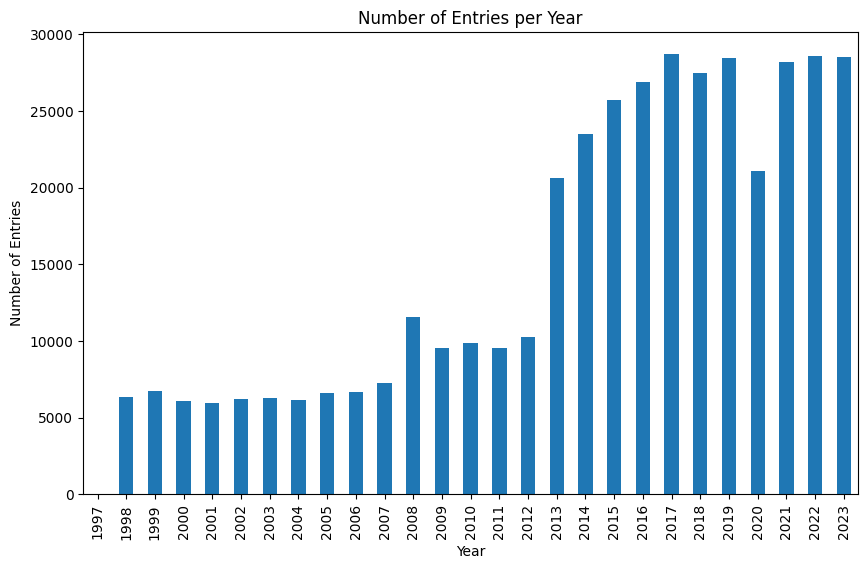

In [ ]:

entries_per_year = df['Year'].value_counts().sort_index()

plt.figure(figsize=(10, 6))

entries_per_year.plot(kind='bar')

plt.title('Number of Entries per Year')
plt.xlabel('Year')
plt.ylabel('Number of Entries')
plt.xticks(rotation=90)

plt.show()

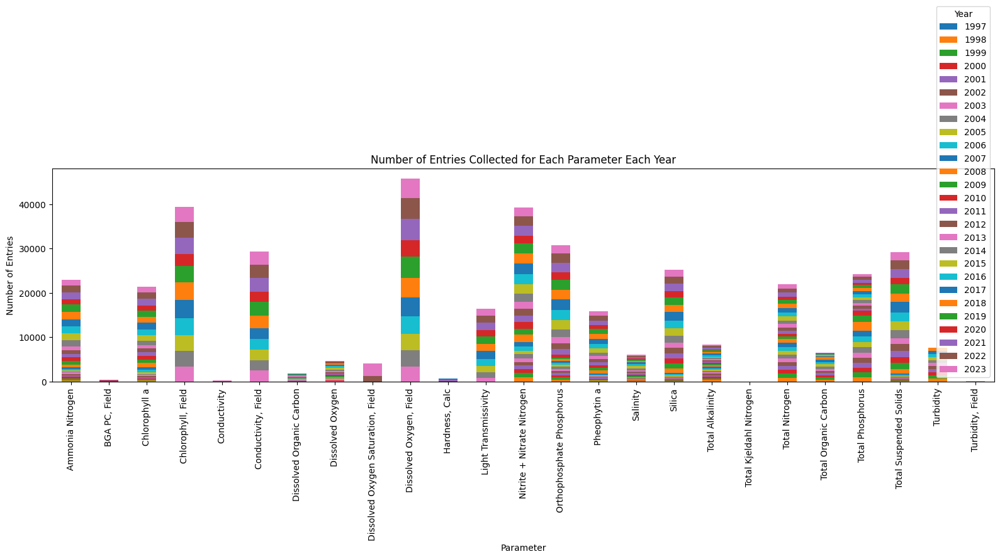

In [ ]:

# plt.figure(figsize=(10, 6))
entries_per_year = df.groupby(['Parameter', 'Year']).size().reset_index(name='Count')
entries_pivot = entries_per_year.pivot(index='Parameter', columns='Year', values='Count').fillna(0)
entries_pivot.plot(kind='bar', stacked=True, figsize=(16, 7), legend=True)
plt.title('Number of Entries Collected for Each Parameter Each Year')
plt.xlabel('Parameter')
plt.ylabel('Number of Entries')
plt.legend(title='Year')
plt.tight_layout()

plt.show()

### Trends of parameters at each site over the years on Whole data

In [ ]:
# parameter_of_interest = 'Nitrite + Nitrate Nitrogen'

def plot_for_parameter(parameter_of_interest, medians, top_sites):
    medians_filtered = medians[medians['Parameter'] == parameter_of_interest]
    fig, axs = plt.subplots(1, 5, figsize=(25, 5), sharey=True)

    for i, site in enumerate(top_sites):
        site_data = medians_filtered[medians_filtered['Site'] == site]
        axs[i].plot(site_data['Year'], site_data['Value'], marker='o', label='Value')
        axs[i].plot(site_data['Year'], site_data['MDL'], marker='x', label='MDL')
        axs[i].plot(site_data['Year'], site_data['RDL'], marker='^', label='RDL')
        axs[i].set_title(f'{parameter_of_interest} at {site}')
        axs[i].set_xlabel('Year')
        if i == 0:
            axs[i].set_ylabel('Median Measurement')
        axs[i].legend()

    plt.tight_layout()
    plt.show()

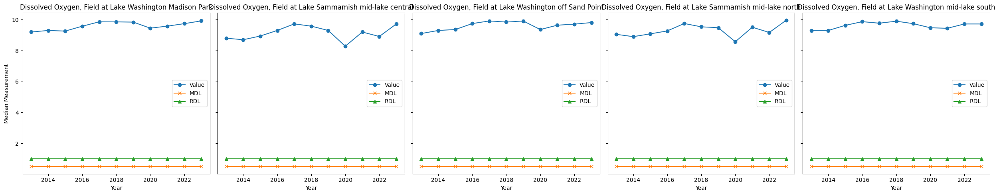

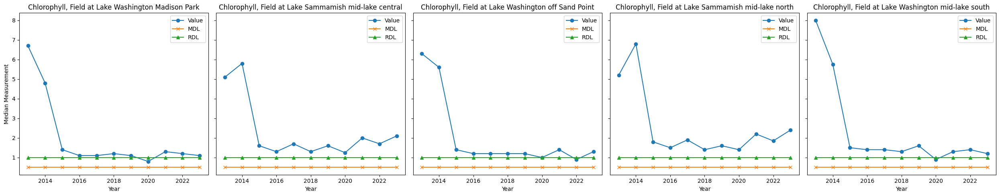

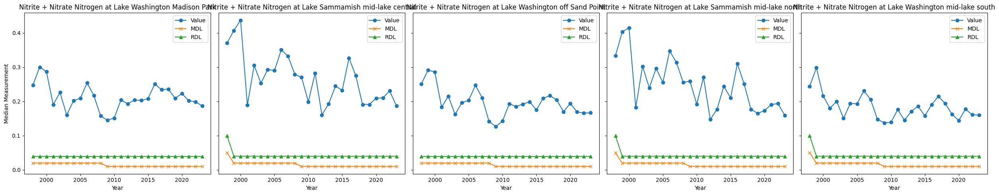

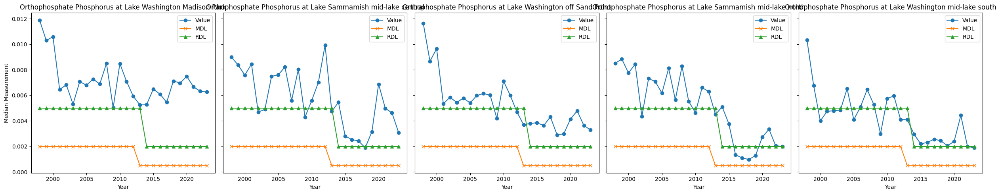

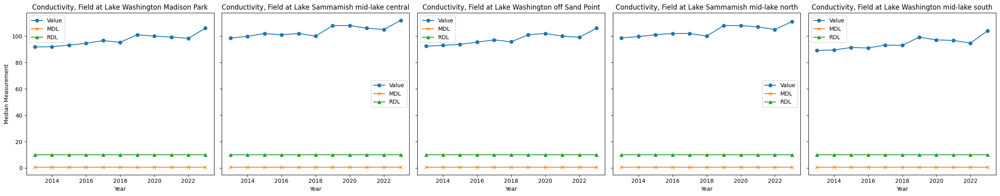

...

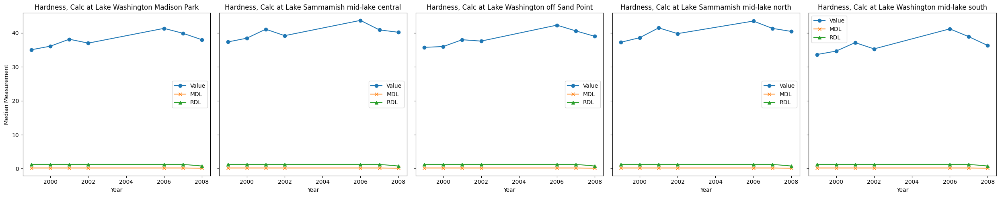

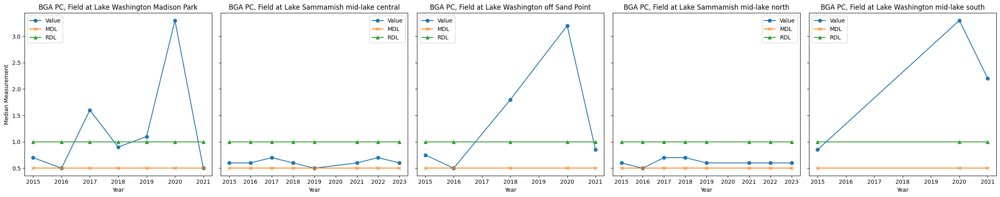

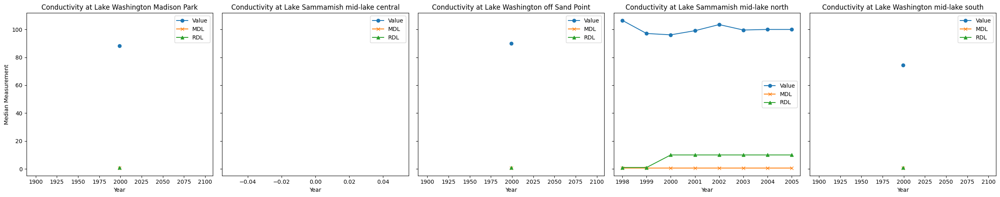

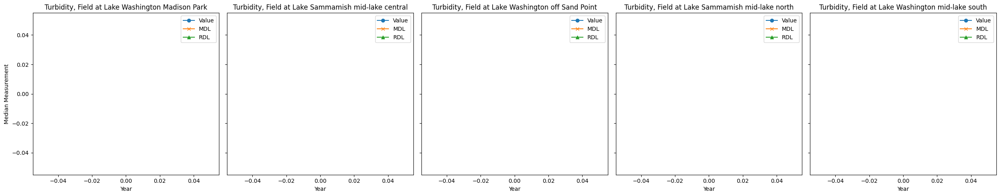

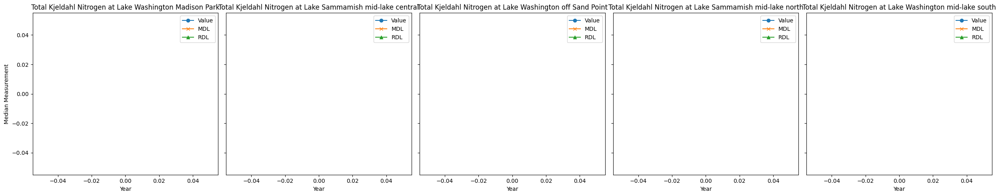

In [ ]:
top_sites = df['Site'].value_counts().head(5).index.tolist()

df_filtered = df[df['Site'].isin(top_sites)]


medians = df_filtered.groupby(['Site', 'Parameter', 'Year']).agg({'Value': 'median',
                                                                    'MDL': 'median',
                                                                    'RDL': 'median'}).reset_index()
for param in df['Parameter'].value_counts().index.tolist():
    plot_for_parameter(param, medians, top_sites)

### Data Segmentation based on Area Type

In [ ]:
# Central Puget Sound
cps = df[df['Area']=='Central Puget Sound']
cps['Year'] = pd.to_datetime(cps['Collect DateTime']).dt.year

<ipython-input-32-90471ebde2c4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cps['Year'] = pd.to_datetime(cps['Collect DateTime']).dt.year


In [ ]:
cps.shape

(200364, 22)

In [ ]:
cps.head(5)

,Unnamed: 0,Sample ID,Grab ID,Profile ID,Sample Number,Collect DateTime,Depth (m),Site Type,Area,Locator,...,Value,Units,QualityId,MDL,RDL,Method,Date Analyzed,Data Source,Time_difference,Normalised_value(mg/L)
0,1,2531,2531.0,329,L63001-3,06/17/2015 10:43:00 AM,1.0,Marine Offshore,Central Puget Sound,NSAJ02,...,0.951,mg/L,1,0.05,0.100,WHITLEDGE 1981,06/18/2015,KCEL,0 days 13:17:00,0.95100
1,3,4609,4609.0,1263,L65931-3,08/15/2016 01:22:00 PM,1.5,Marine Offshore,Central Puget Sound,LTUM03,...,17.900,PSS,1,2.00,3.000,SM2520-B,08/25/2016,KCEL,9 days 10:38:00,0.01790
2,4,2747,2747.0,58,L62666-12,05/18/2015 09:22:00 AM,196.0,Marine Offshore,Central Puget Sound,KSBP01,...,0.750,ug/L,1,0.06,0.120,CTD,05/18/2015,KCEL,-1 days +14:38:00,0.00075
3,5,4722,4714.0,1253,L65761-5,07/19/2016 08:30:00 AM,1.0,Marine Offshore,Central Puget Sound,MSWH01,...,0.510,ug/L,1,0.26,0.522,EPA445.0,08/15/2016,KCEL,26 days 15:30:00,0.00051
4,7,6189,6189.0,2362,L59977-3,04/22/2014 10:37:00 AM,6.7,Marine Offshore,Central Puget Sound,LTUM03,...,9.100,mg/L,1,0.10,0.500,SM4500-O-C,04/23/2014,KCEL,0 days 13:23:00,9.10000


#### Area='Lake Washington'

In [ ]:
# Lake Washington
lw = df[df['Area']=='Lake Washington']

In [ ]:
lw.shape

(130403, 22)

In [ ]:
lw.head(5)

,Unnamed: 0,Sample ID,Grab ID,Profile ID,Sample Number,Collect DateTime,Depth (m),Site Type,Area,Locator,...,Value,Units,QualityId,MDL,RDL,Method,Date Analyzed,Data Source,Time_difference,Normalised_value(mg/L)
31388,59472,196484,196484.0,81548,L76445-11,02/08/2021 08:10:00 AM,21.0,Large Lakes,Lake Washington,0826,...,101.0000,umhos/cm,1,0.500,10.00,KCEL SOP# 245,02/08/2021,KCEL,-1 days +15:50:00,50.5000
31391,59491,158392,158392.0,68705,L71034-117,09/24/2018 11:52:00 AM,13.1,Large Lakes,Lake Washington,0831,...,0.5000,ug/L,1,0.500,1.00,KCEL SOP# 245,09/24/2018,KCEL,-1 days +12:08:00,0.0005
31392,59517,59074,59074.0,41694,L22008-3,09/04/2001 10:21:00 AM,5.0,Large Lakes,Lake Washington,0852,...,0.1660,mg/L,2,0.050,0.10,SM4500-N-C (03-03-013-000),09/20/2001,KCEL,15 days 13:39:00,0.1660
31393,59518,127036,127036.0,50526,L63507-94,07/29/2015 01:21:00 PM,3.0,Large Lakes,Lake Washington,0831,...,98.7000,umhos/cm,1,0.500,10.00,KCEL SOP# 245,07/29/2015,KCEL,-1 days +10:39:00,49.3500
31394,59520,129118,129118.0,49942,L33337-23,09/20/2004 11:15:00 AM,1.0,Large Lakes,Lake Washington,0829,...,0.0085,mg/L,2,0.005,0.01,"SM4500-P-B,FMOD(03-03-013-001)",09/22/2004,KCEL,1 days 12:45:00,0.0085


#### Area = 'Lake Sammamish'

In [ ]:
# Lake Sammamish
ls = df[df['Area']=='Lake Sammamish']

In [ ]:
ls.shape

(72116, 22)

In [ ]:
ls.head(5)

,Unnamed: 0,Sample ID,Grab ID,Profile ID,Sample Number,Collect DateTime,Depth (m),Site Type,Area,Locator,...,Value,Units,QualityId,MDL,RDL,Method,Date Analyzed,Data Source,Time_difference,Normalised_value(mg/L)
31386,59468,54634,54634.0,42121,L59920-38,03/24/2014 09:58:00 AM,5.0,Large Lakes,Lake Sammamish,0612,...,0.5200,mg/L,2,0.050,0.10,SM4500-N-C,03/28/2014,KCEL,3 days 14:02:00,0.5200
31389,59481,190289,190289.0,79873,L74186-45,02/11/2020 10:03:00 AM,2.0,Large Lakes,Lake Sammamish,0612,...,11.0000,mg/L,1,0.500,1.00,KCEL SOP# 245,02/11/2020,KCEL,-1 days +13:57:00,11.0000
31399,59542,54635,54635.0,42121,L59920-39,03/24/2014 09:49:00 AM,10.0,Large Lakes,Lake Sammamish,0612,...,1.4000,mg/L,2,0.500,1.00,SM2540-D,03/26/2014,KCEL,1 days 14:11:00,1.4000
31401,59560,159868,159868.0,69046,L71572-35,01/08/2019 09:05:00 AM,20.0,Large Lakes,Lake Sammamish,0612,...,0.2060,mg/L,1,0.010,0.04,SM4500-NO3-F,01/09/2019,KCEL,0 days 14:55:00,0.2060
31403,59573,103272,103272.0,47372,L22010-26,09/05/2001 12:56:00 PM,1.0,Large Lakes,Lake Sammamish,0625,...,0.0175,mg/L,2,0.005,0.01,"SM4500-P-B,Fmod(03-03-013-000)",09/25/2001,KCEL,19 days 11:04:00,0.0175


### Obseravtions in three different locations

In [ ]:
location_rows = [cps.shape[0], lw.shape[0], ls.shape[0]]
titles = ['Central Puget Sound','Lake Washington','Lake Sammamish']

plt.figure(figsize=(10, 6))
plt.bar(titles, location_rows, color=['blue', 'green', 'red'])

plt.xlabel('Location')
plt.ylabel('Number of Rows (Entries)')
plt.title('Number of Entries per Location')

plt.show()

NameError: name 'lw' is not defined

### Starting with Central Puget Sound

In [ ]:
cps.head(5)

,Unnamed: 0,Sample ID,Grab ID,Profile ID,Sample Number,Collect DateTime,Depth (m),Site Type,Area,Locator,...,Value,Units,QualityId,MDL,RDL,Method,Date Analyzed,Data Source,Time_difference,Normalised_value(mg/L)
0,1,2531,2531.0,329,L63001-3,06/17/2015 10:43:00 AM,1.0,Marine Offshore,Central Puget Sound,NSAJ02,...,0.951,mg/L,1,0.05,0.100,WHITLEDGE 1981,06/18/2015,KCEL,0 days 13:17:00,0.95100
1,3,4609,4609.0,1263,L65931-3,08/15/2016 01:22:00 PM,1.5,Marine Offshore,Central Puget Sound,LTUM03,...,17.900,PSS,1,2.00,3.000,SM2520-B,08/25/2016,KCEL,9 days 10:38:00,0.01790
2,4,2747,2747.0,58,L62666-12,05/18/2015 09:22:00 AM,196.0,Marine Offshore,Central Puget Sound,KSBP01,...,0.750,ug/L,1,0.06,0.120,CTD,05/18/2015,KCEL,-1 days +14:38:00,0.00075
3,5,4722,4714.0,1253,L65761-5,07/19/2016 08:30:00 AM,1.0,Marine Offshore,Central Puget Sound,MSWH01,...,0.510,ug/L,1,0.26,0.522,EPA445.0,08/15/2016,KCEL,26 days 15:30:00,0.00051
4,7,6189,6189.0,2362,L59977-3,04/22/2014 10:37:00 AM,6.7,Marine Offshore,Central Puget Sound,LTUM03,...,9.100,mg/L,1,0.10,0.500,SM4500-O-C,04/23/2014,KCEL,0 days 13:23:00,9.10000


In [ ]:
cps.columns

Index(['Unnamed: 0', 'Sample ID', 'Grab ID', 'Profile ID', 'Sample Number',
       'Collect DateTime', 'Depth (m)', 'Site Type', 'Area', 'Locator', 'Site',
       'Parameter', 'Value', 'Units', 'QualityId', 'MDL', 'RDL', 'Method',
       'Date Analyzed', 'Data Source', 'Time_difference',
       'Normalised_value(mg/L)'],
      dtype='object')

In [ ]:
df.isnull().sum()

Unnamed: 0                0
Sample ID                 0
Grab ID                   0
Profile ID                0
Sample Number             0
Collect DateTime          0
Depth (m)                 0
Site Type                 0
Area                      0
Locator                   0
Site                      0
Parameter                 0
Value                     0
Units                     0
QualityId                 0
MDL                       0
RDL                       0
Method                    0
Date Analyzed             0
Data Source               0
Time_difference           0
Normalised_value(mg/L)    0
dtype: int64



*   We have zero missing values



In [ ]:
cps.nunique()


Unnamed: 0                200364
Sample ID                  24784
Grab ID                    24277
Profile ID                  5542
Sample Number              24784
Collect DateTime           21275
Depth (m)                    400
Site Type                      1
Area                           1
Locator                       23
Site                          22
Parameter                     19
Value                       3610
Units                          6
QualityId                      6
MDL                          141
RDL                         1196
Method                        88
Date Analyzed               3284
Data Source                    1
Time_difference            10992
Normalised_value(mg/L)      4629
dtype: int64

#### Correlation Heapmap

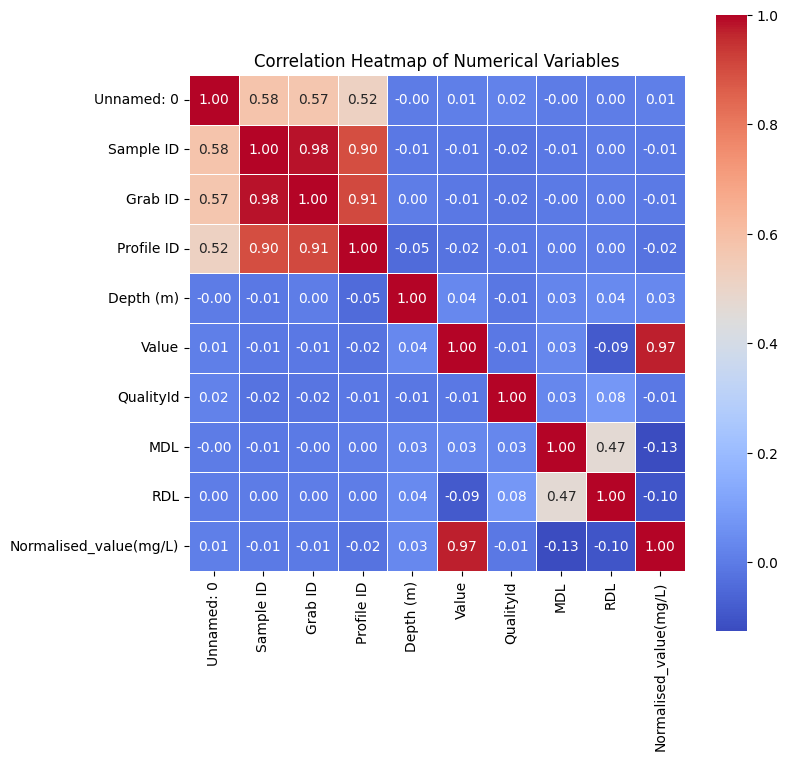

In [ ]:
# Selecting only numerical columns for correlation calculation
numerical_cps = cps.select_dtypes(include=['float64', 'int64'])

corr_matrix = numerical_cps.corr()

plt.figure(figsize=(8, 8))

sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True, linewidths=.5)

plt.title('Correlation Heatmap of Numerical Variables')

plt.show()

* 'QualityId' seems to have very little to no correlation with the measured 'Value' or its normalized counterpart, suggesting that the quality assessment is independent of the magnitude of the measurement. This could indicate that quality ratings are based on factors other than just the numeric value, such as the precision of the measurement or adherence to sampling protocols.

* The 'MDL' (Method Detection Limit) and 'RDL' (Reporting Detection Limit) show a moderate correlation, indicating that as the detection limit of the method improves (gets lower), the reporting limit also tends to be lower. However, both 'MDL' and 'RDL' show little correlation with actual measured 'Value', which could mean that the range of observed values mostly falls within the detectable and reportable range.

* 'Depth (m)' shows little to no correlation with other variables, implying that the sampled depth may not significantly influence the measured values or the sample identification process in this dataset.

By 11:50

1. Quality ID
2. Parameters
2. MDP/RDP
3. Value
4. MDP vs Value

### Quality ID

1. What's quality id representing?
2. Does 1 means good or bad?


In [ ]:
cps['QualityId'].unique()

array([1, 3, 4, 6, 2, 0])

In [ ]:
cps['QualityId'].value_counts()

1    196806
3      1280
0      1041
4       709
6       267
2       261
Name: QualityId, dtype: int64

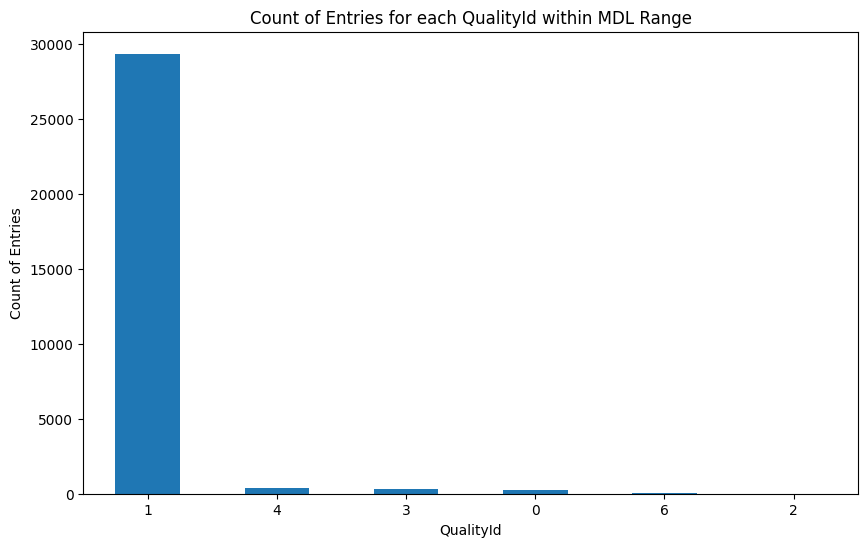

In [ ]:
filtered_df = cps[(cps['Value'] >= cps['MDL']) & (cps['Value'] <= cps['RDL'])]

quality_id_counts = filtered_df['QualityId'].value_counts()

plt.figure(figsize=(10, 6))
quality_id_counts.plot(kind='bar')
plt.xlabel('QualityId')
plt.ylabel('Count of Entries')
plt.title('Count of Entries for each QualityId within MDL Range')
plt.xticks(rotation=0)
plt.show()

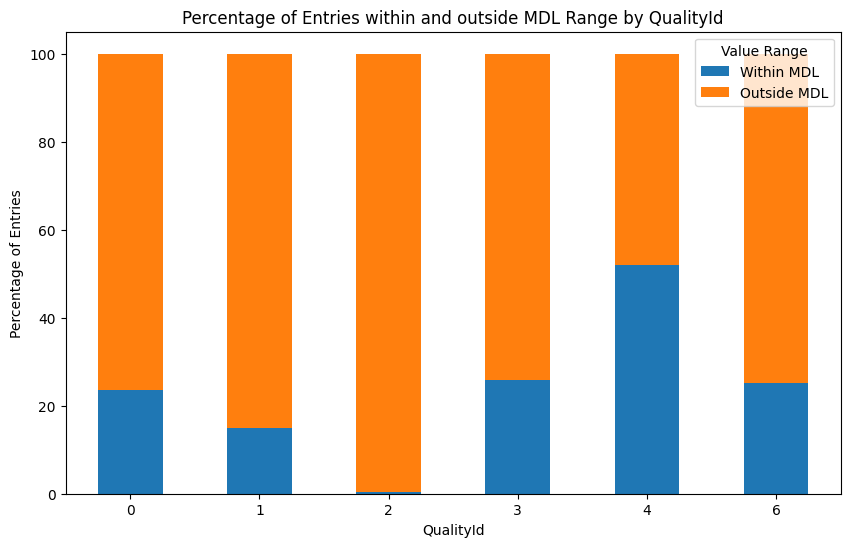

In [ ]:
def calculate_percentages(df):
    total_count = df.shape[0]
    within_mdl_count = df[(df['Value'] >= df['MDL']) & (df['Value'] <= df['RDL'])].shape[0]
    outside_mdl_count = total_count - within_mdl_count
    return (within_mdl_count / total_count) * 100, (outside_mdl_count / total_count) * 100

percentages = cps.groupby('QualityId').apply(calculate_percentages)
percentages_df = pd.DataFrame(percentages.tolist(), index=percentages.index, columns=['Within MDL', 'Outside MDL'])

percentages_df.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.xlabel('QualityId')
plt.ylabel('Percentage of Entries')
plt.title('Percentage of Entries within and outside MDL Range by QualityId')
plt.xticks(rotation=0)
plt.legend(title='Value Range')
plt.show()

1. The 'Value' represents the actual measured concentration of a particular analyte in the water sample. If the 'Value' is below the MDL, it suggests that the concentration of the contaminant is too low to be distinguished from zero with confidence. It may be considered as 'not detected'.

2. If the 'Value' is above the MDL but below the RDL, it means that the substance is detected but may not be quantifiable at a level that can be confidently reported as accurate.

3. A 'Value' above the RDL suggests that the concentration can be reported accurately and is typically above the minimum level at which regulatory compliance or non-compliance can be determined.

In [ ]:
cps[['QualityId', 'Units', 'MDL', 'RDL', 'Value']].head(5)

,QualityId,Units,MDL,RDL,Value
0,1,mg/L,0.05,0.100,0.951
1,1,PSS,2.00,3.000,17.900
2,1,ug/L,0.06,0.120,0.750
3,1,ug/L,0.26,0.522,0.510
4,1,mg/L,0.10,0.500,9.100


* What are different parameter collected at different sites
* Compare quality Id's of different parameter
    * at different sites
    * at different collected dates (It would be great if we plot how results changed with the time)
* Compare normalized value of each parameter
    * at different sites
    * at different collected dates
    * at different analyzed dates



In [ ]:
cps['Locator'].unique()

array(['NSAJ02', 'LTUM03', 'KSBP01', 'MSWH01', 'LTKE03', 'LTBC43',
       'KSSK02', 'LSKQ06', 'NSEX01', 'LSNT01', 'CK200P', 'LSEP01',
       'LTED04', 'JSUR01', 'MSJN02', 'LTXQ01', 'HNFD01', 'LSVV01',
       'PTWILLBUOY', 'SEAQYSI', 'KSIW02', 'LTBC42', 'KSRU03'],
      dtype=object)

In [ ]:
cps['Parameter'].unique()

array(['Silica', 'Salinity', 'Chlorophyll, Field', 'Pheophytin a',
       'Dissolved Oxygen', 'Nitrite + Nitrate Nitrogen',
       'Light Transmissivity', 'Total Suspended Solids',
       'Dissolved Oxygen, Field', 'Orthophosphate Phosphorus',
       'Ammonia Nitrogen', 'Total Organic Carbon',
       'Dissolved Organic Carbon', 'Chlorophyll a', 'Total Nitrogen',
       'Turbidity, Field', 'Total Phosphorus', 'Turbidity',
       'Total Kjeldahl Nitrogen'], dtype=object)

Parameter

In [ ]:
cps['Parameter'].value_counts()

Silica                        22524
Nitrite + Nitrate Nitrogen    22298
Total Suspended Solids        21352
Orthophosphate Phosphorus     18825
Dissolved Oxygen, Field       17316
Chlorophyll, Field            16372
Light Transmissivity          16370
Chlorophyll a                 15898
Ammonia Nitrogen              14922
Pheophytin a                  14685
Salinity                       6106
Dissolved Oxygen               4579
Total Phosphorus               3942
Total Nitrogen                 2483
Total Organic Carbon           1211
Dissolved Organic Carbon       1210
Turbidity, Field                122
Turbidity                        97
Total Kjeldahl Nitrogen          52
Name: Parameter, dtype: int64

In [ ]:
top_parameters = cps['Parameter'].value_counts().head(10).index.tolist()
top_parameters

['Silica',
 'Nitrite + Nitrate Nitrogen',
 'Total Suspended Solids',
 'Orthophosphate Phosphorus',
 'Dissolved Oxygen, Field',
 'Chlorophyll, Field',
 'Light Transmissivity',
 'Chlorophyll a',
 'Ammonia Nitrogen',
 'Pheophytin a']

<ipython-input-42-6df1979d4467>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Value', y='Parameter', data=top_params_df, palette="vlag")


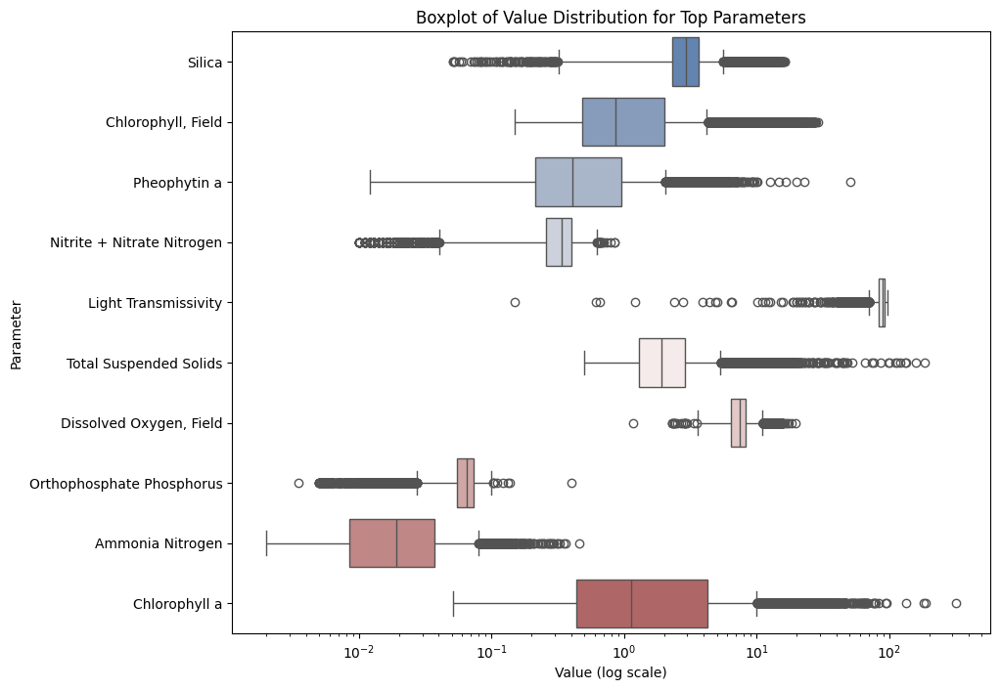

In [ ]:
top_params_df = cps[cps['Parameter'].isin(top_parameters)]

plt.figure(figsize=(10, 8))

sns.boxplot(x='Value', y='Parameter', data=top_params_df, palette="vlag")

plt.xscale('log')

plt.xlabel('Value (log scale)')
plt.ylabel('Parameter')
plt.title('Boxplot of Value Distribution for Top Parameters')

plt.show()

* Variability and Scale Differences: Each parameter has a different level of variability in its measurements. Parameters such as 'Chlorophyll a' and 'Ammonia Nitrogen' exhibit a broad spread of values, as seen by the extensive range of their interquartile ranges (the lengths of the boxes) and the reach of their whiskers. This suggests a high level of variability in the data for these parameters. The log scale on the x-axis also highlights that the 'Value' spans several orders of magnitude across different parameters.

* Outliers and Distribution Shape: Many parameters show a significant number of outliers, which are the individual points beyond the whiskers of the boxplots. For example, 'Silica' and 'Dissolved Oxygen, Field' have a relatively large number of outliers on the higher end. Outliers can indicate unusual events or errors in data collection. The distribution of 'Value' for several parameters is skewed, with some leaning towards higher values (right-skewed) such as 'Chlorophyll a', and others towards lower values (left-skewed) like 'Nitrite + Nitrate Nitrogen'.

#### Number of entries in each year

<ipython-input-46-eac4e3163024>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cps['Year'] = pd.to_datetime(cps['Collect DateTime']).dt.year


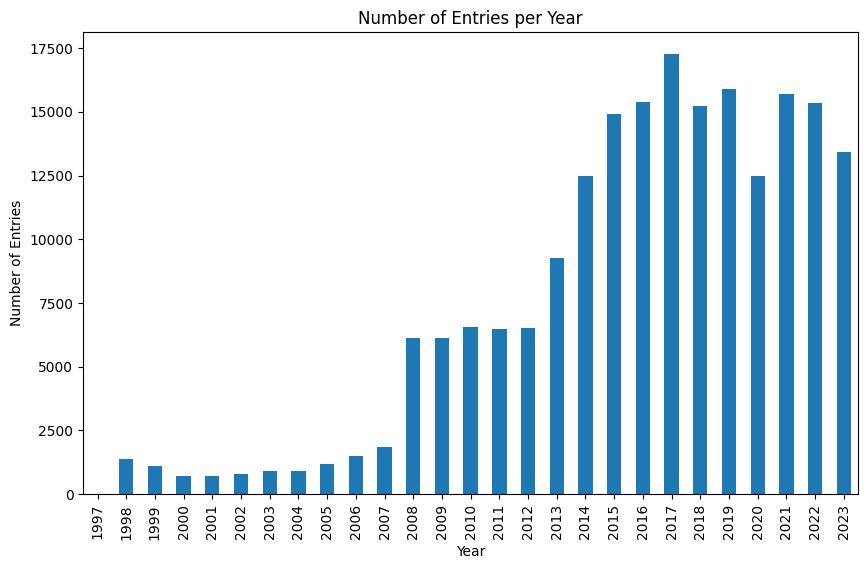

In [ ]:
cps['Year'] = pd.to_datetime(cps['Collect DateTime']).dt.year

entries_per_year = cps['Year'].value_counts().sort_index()
plt.xticks(rotation=90)
plt.figure(figsize=(10, 6))
entries_per_year.plot(kind='bar')
plt.title('Number of Entries per Year')
plt.xlabel('Year')
plt.ylabel('Number of Entries')

plt.show()

### Number of entries in each year in Whole dataset

#### Parameter collected on each year

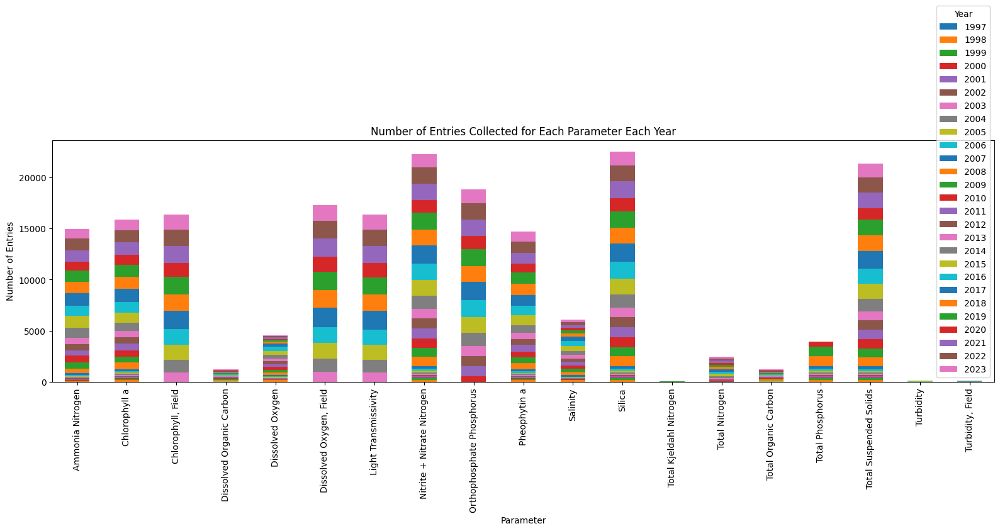

In [ ]:

entries_per_year = cps.groupby(['Parameter', 'Year']).size().reset_index(name='Count')
entries_pivot = entries_per_year.pivot(index='Parameter', columns='Year', values='Count').fillna(0)
entries_pivot.plot(kind='bar', stacked=True, figsize=(16, 7), legend=True)
plt.title('Number of Entries Collected for Each Parameter Each Year')
plt.xlabel('Parameter')
plt.ylabel('Number of Entries')
plt.legend(title='Year')
plt.tight_layout()

plt.show()

#### Handling Outliers

My thought on what I should do with values that are not in IQR

Group by ['Parameter', 'Site', 'Year'], calculate it's quantile ranges, if a point is out side of minimum or maximum, impute it with median of the group

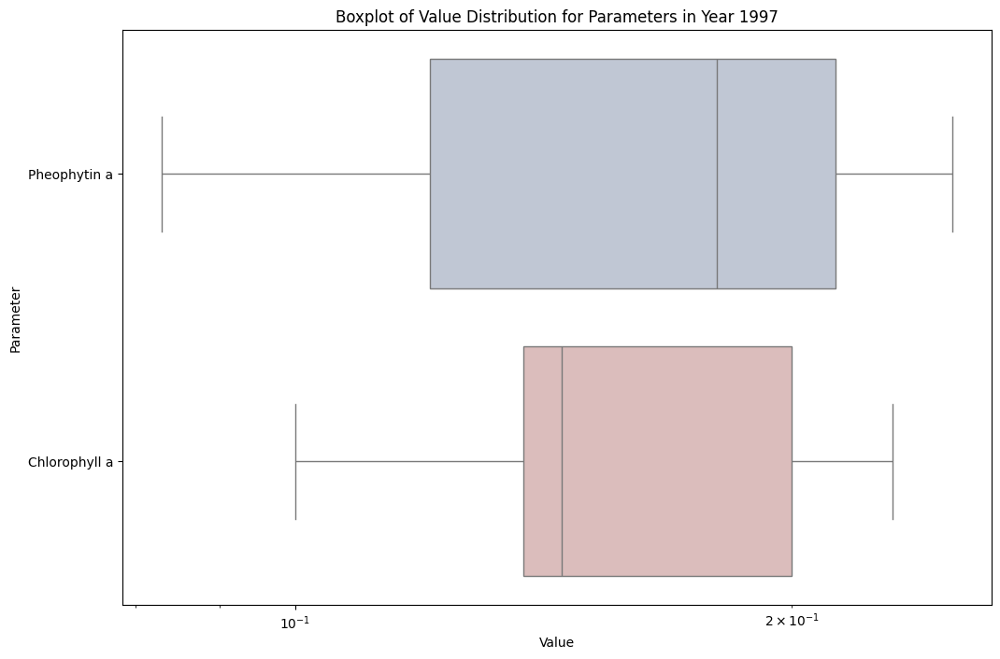

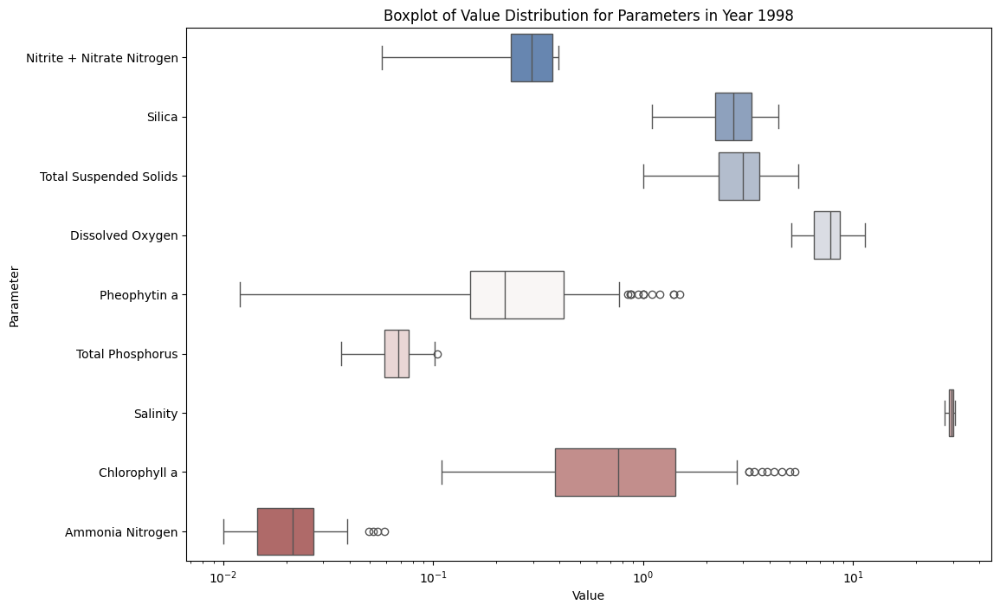

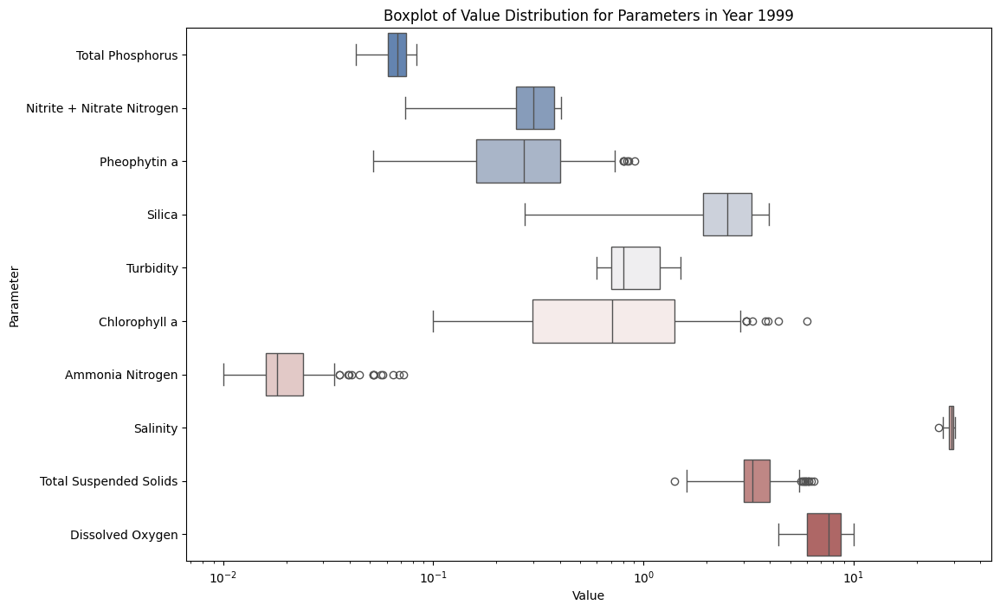

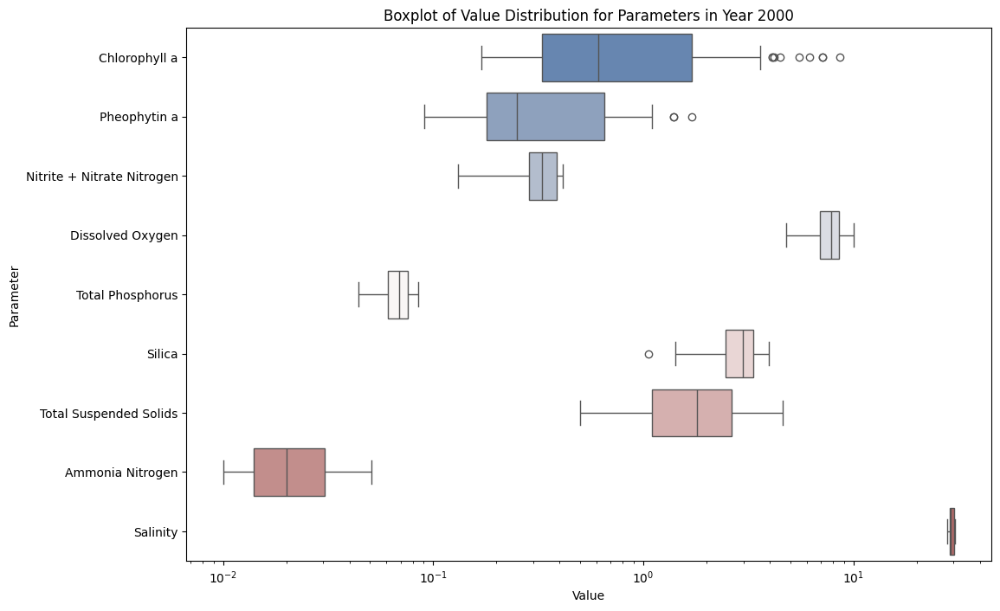

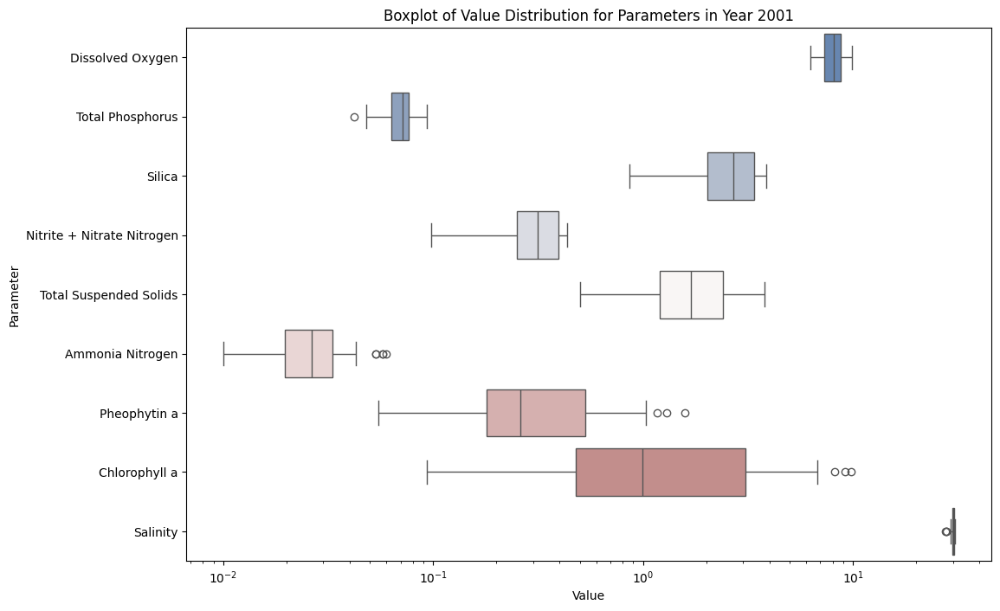

...

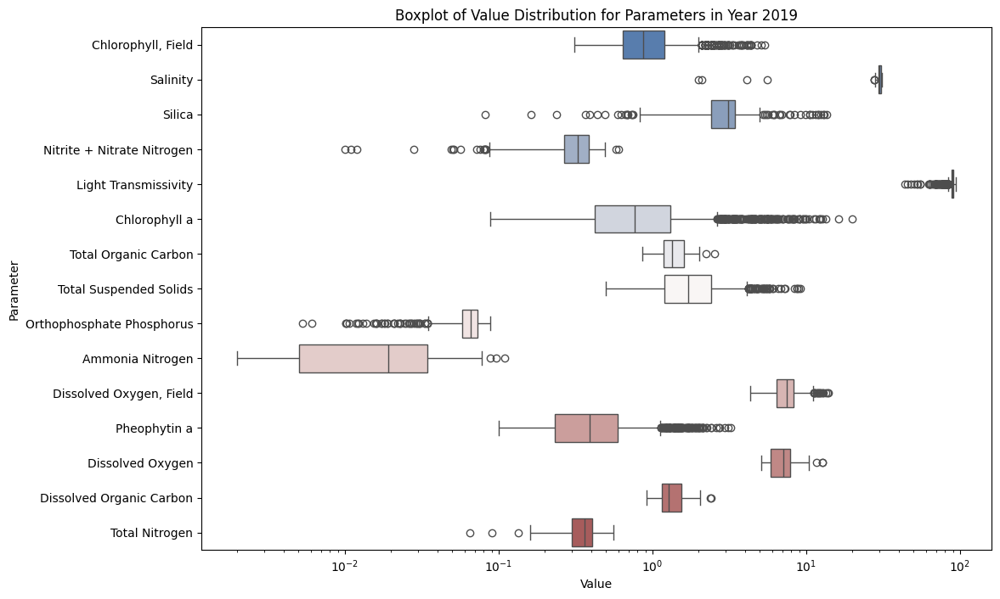

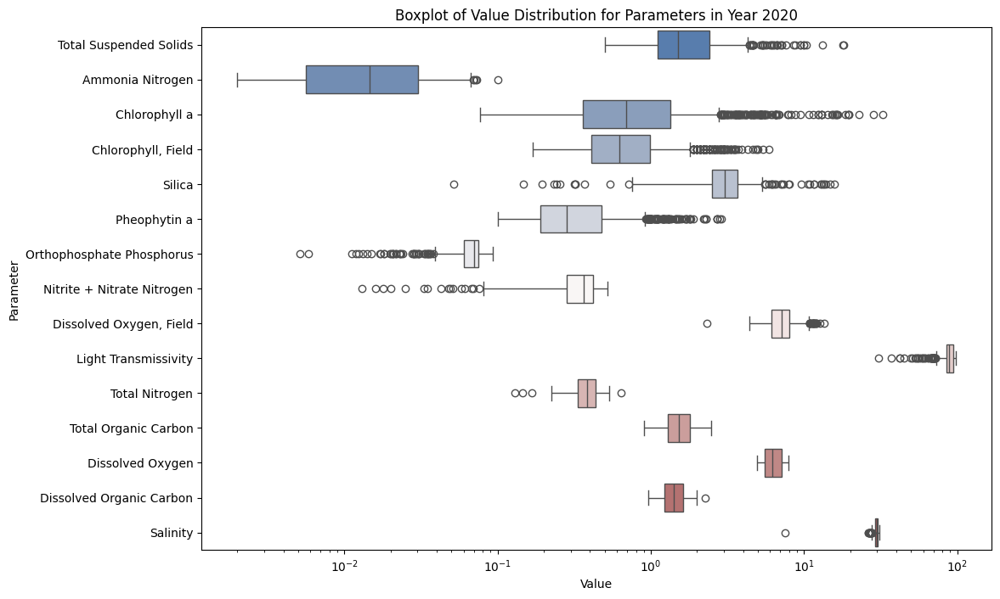

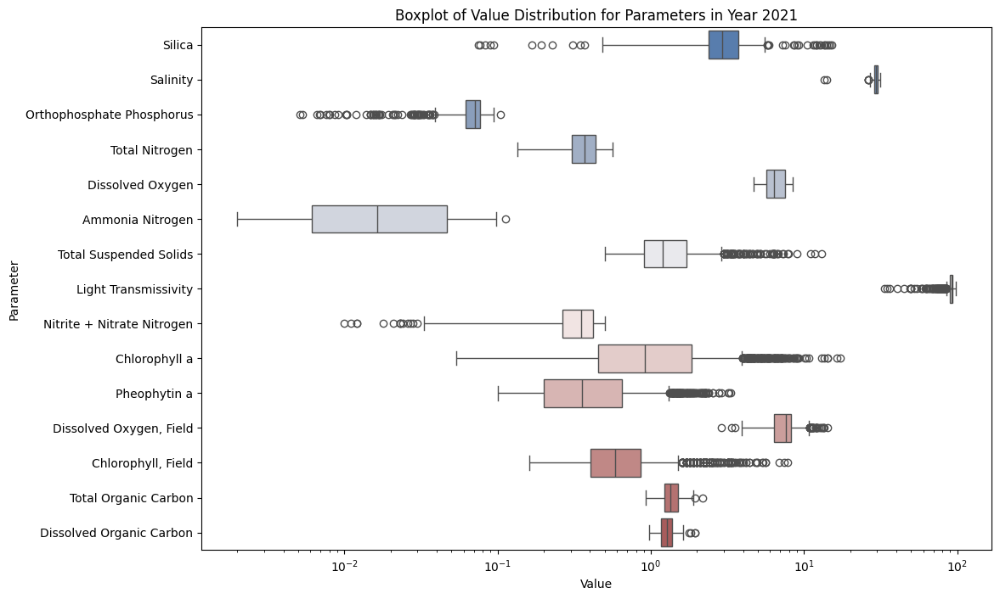

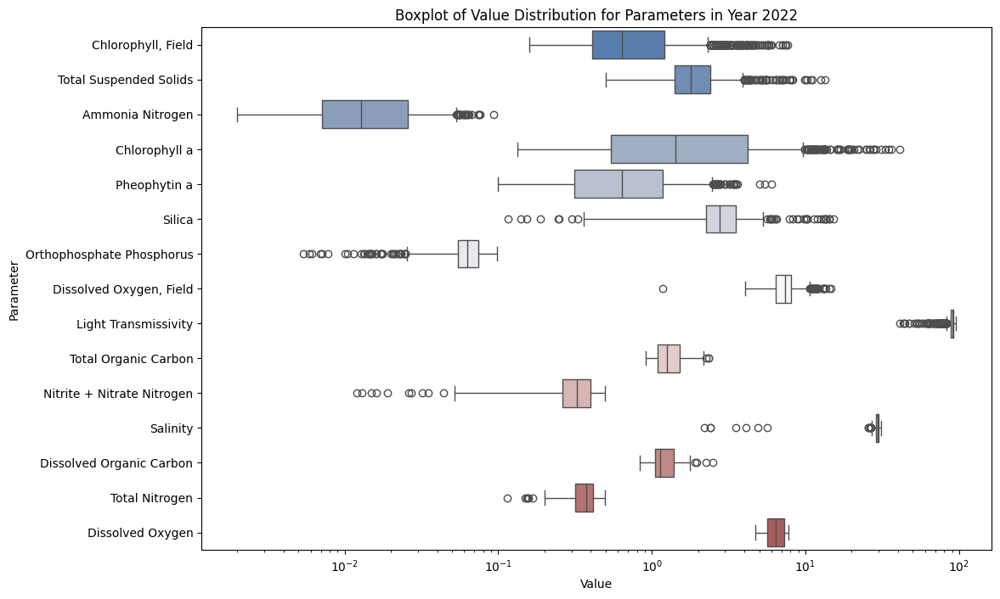

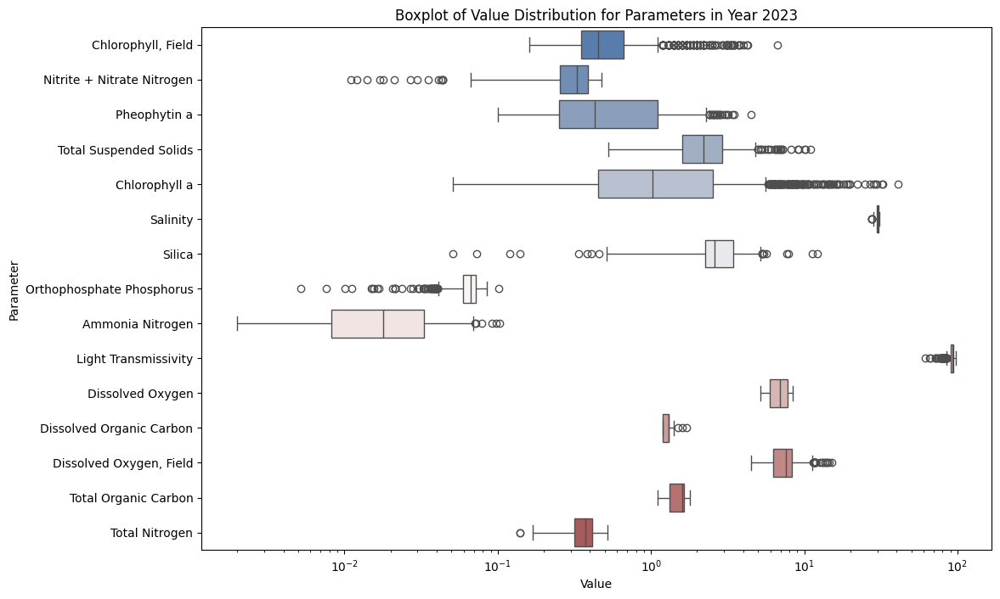

In [ ]:
grouped = cps.groupby(['Parameter', 'Site', 'Year'])

def replace_outliers_with_median(group):
    q1 = group['Value'].quantile(0.25)
    q3 = group['Value'].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    median_value = group['Value'].median()
    group['Value'] = np.where((group['Value'] < lower_bound) | (group['Value'] > upper_bound),
                              median_value, group['Value'])
    return group

cleaned_cps = grouped.apply(replace_outliers_with_median).reset_index(drop=True)

years = cleaned_cps['Year'].unique()

for year in sorted(years):
    plt.figure(figsize=(12, 8))
    subset = cleaned_cps[cleaned_cps['Year'] == year]
    sns.boxplot(x='Value', y='Parameter', data=subset, palette="vlag")
    plt.xscale('log')
    plt.title(f'Boxplot of Value Distribution for Parameters in Year {year}')
    plt.show()

### Sites

In [ ]:
cps['Site'].unique()

array(['Dockton Park', 'Duwamish River - South Park Bridge',
       'Jefferson Head', 'Quartermaster Harbor Yacht Club',
       'Duwamish River - Harbor Island Marina', 'Elliott West Outfall',
       'West Point Outfall', 'Alki Outfall', 'East Passage',
       'Point Williams', 'Carkeek Outfall', 'South Plant Outfall',
       'South Central Elliott Bay', 'Point Wells', 'Vashon Outfall',
       'Duwamish River - Henderson/MLK Outfall',
       'Duwamish River - East Waterway', 'Fauntleroy Cove',
       'Point Williams Buoy', 'Seattle Aquarium',
       'Denny Way Short Outfall', 'Outer Salmon Bay'], dtype=object)

In [ ]:
top_sites = cps['Site'].value_counts().head(10).index.tolist()
top_sites

['Jefferson Head',
 'Point Williams',
 'South Plant Outfall',
 'East Passage',
 'Point Wells',
 'Carkeek Outfall',
 'South Central Elliott Bay',
 'West Point Outfall',
 'Alki Outfall',
 'Vashon Outfall']

### Trends of parameters at each site over the years

* Water Clarity and Quality: Consistent levels of 'Silica' and 'Dissolved Oxygen' are generally positive indicators of water quality, as oxygen is crucial for aquatic organisms. Good water clarity, indicated by the control of 'Total Suspended Solids', is important for both the health of aquatic ecosystems and recreational uses of the water.

* Nutrient Levels: Nutrient levels represented by 'Nitrite + Nitrate Nitrogen' and 'Orthophosphate Phosphorus' should be carefully monitored, as imbalances can lead to harmful environmental changes. The data suggest that, apart from the observed spike, these levels have been stable, which is beneficial for maintaining aquatic life balance.

In [ ]:
# parameter_of_interest = 'Nitrite + Nitrate Nitrogen'

def plot_for_parameter(parameter_of_interest, medians):
    medians_filtered = medians[medians['Parameter'] == parameter_of_interest]
    fig, axs = plt.subplots(1, 5, figsize=(25, 5), sharey=True)

    for i, site in enumerate(top_sites):
        # Make sure to use 'medians_filtered' to get data for the specific parameter of interest
        site_data = medians_filtered[medians_filtered['Site'] == site]
        axs[i].plot(site_data['Year'], site_data['Value'], marker='o', label='Value')
        axs[i].plot(site_data['Year'], site_data['MDL'], marker='x', label='MDL')
        axs[i].plot(site_data['Year'], site_data['RDL'], marker='^', label='RDL')
        axs[i].set_title(f'{parameter_of_interest} at {site}')
        axs[i].set_xlabel('Year')
        if i == 0:
            axs[i].set_ylabel('Median Measurement')
        axs[i].legend()

    plt.tight_layout()
    plt.show()

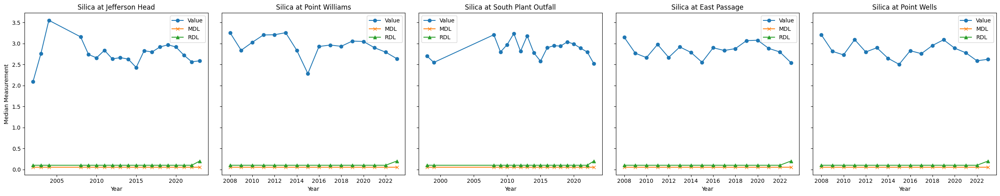

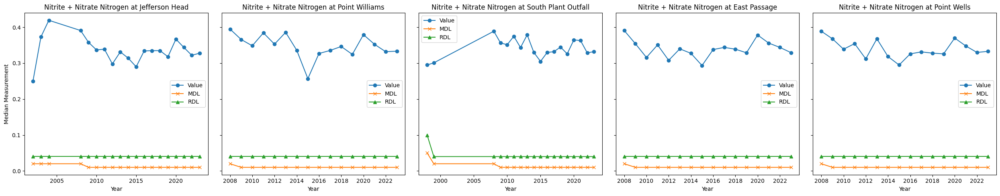

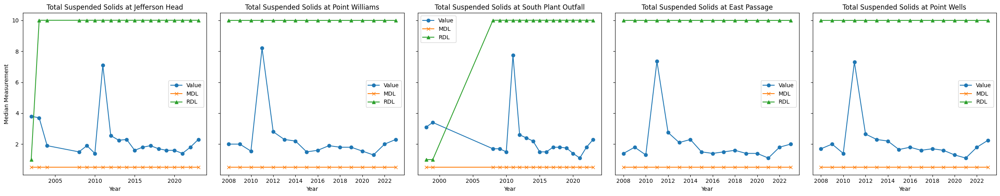

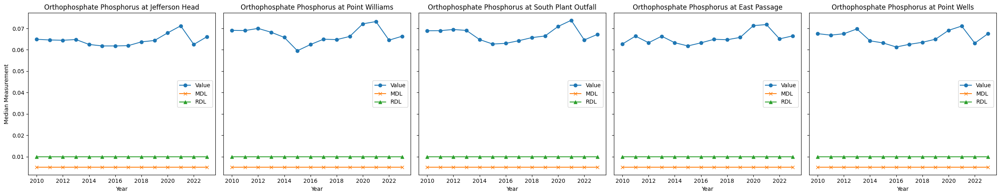

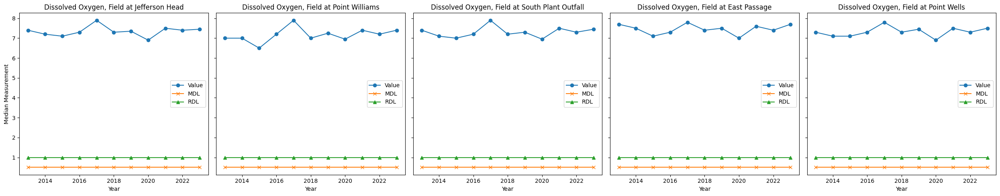

...

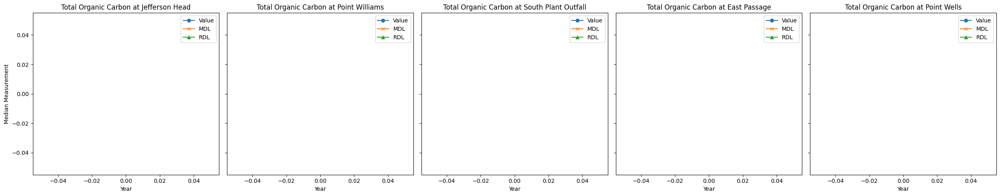

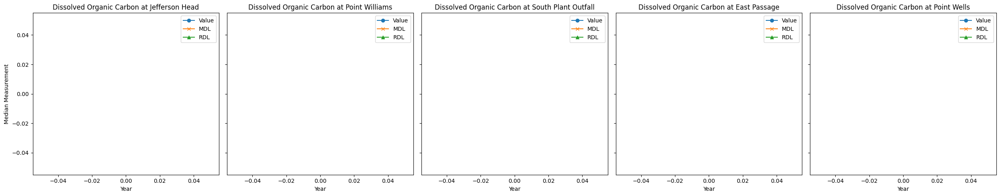

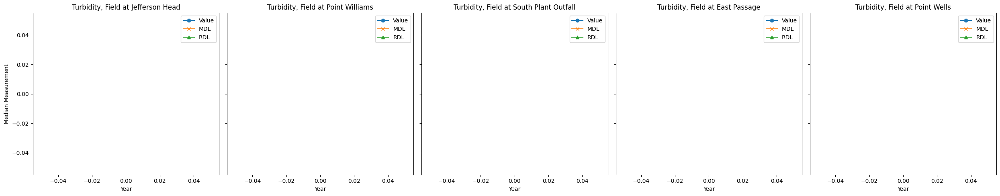

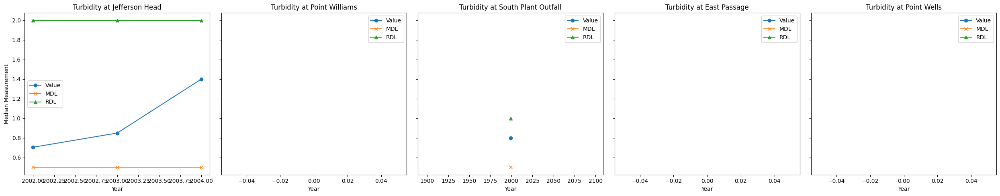

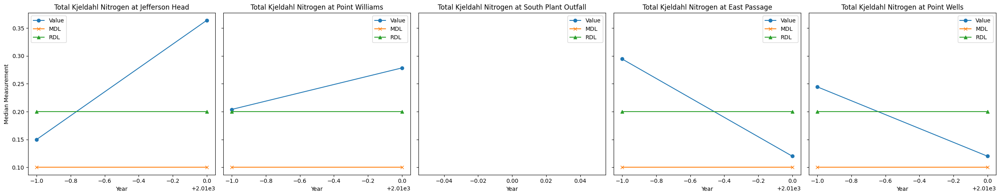

In [ ]:
top_sites = cps['Site'].value_counts().head(5).index.tolist()

cps_filtered = cps[cps['Site'].isin(top_sites)]


medians = cps_filtered.groupby(['Site', 'Parameter', 'Year']).agg({'Value': 'median',
                                                                    'MDL': 'median',
                                                                    'RDL': 'median'}).reset_index()
for param in cps['Parameter'].value_counts().index.tolist():
    plot_for_parameter(param, medians)

* Testing Reliability: The consistently low MDL and RDL across all sites suggest that the testing for Nitrite + Nitrate Nitrogen is reliable and capable of detecting even low concentrations, ensuring accurate water quality monitoring.

* Nitrogen Variability: There's notable variability in Nitrite + Nitrate Nitrogen concentrations over time, which could reflect the impact of various natural and human-induced factors, such as seasonal cycles or pollution sources.

* Localized Differences: Distinct patterns in Nitrogen levels at different sites indicate that local environmental conditions or activities significantly influence these levels, highlighting the need for site-specific water management approaches.
* The median Orthophosphate Phosphorus 'Value' exhibits an overall stable trend with some fluctuation over the years. These fluctuations could be associated with changes in the local environment, varying sources of phosphorus input, or ecological processes affecting phosphorus availability.

* Jefferson Head has seen some dramatic moments, especially with the Total Suspended Solids. A spike like the one around 2010 could have clouded the waters, possibly affecting the marine life that depends on sunlight and clear waters for survival. If such events are due to human activities, it's crucial we investigate and implement better sediment control measures. On the other hand, the relatively stable levels of Dissolved Oxygen here are reassuring, but the dips do warn us to remain vigilant about potential factors that could deplete these crucial oxygen levels.

* At Point Williams, the trend in Ammonia Nitrogen raises an eyebrow. Fluctuations in this nutrient might indicate varying levels of runoff making their way into the waters. Since ammonia can be toxic to aquatic organisms, especially at higher concentrations, it's essential for local environmental agencies to keep a close watch on potential sources, like agricultural runoff or wastewater discharges.

* South Plant Outfall is showing something intriguing with Chlorophyll a – those peaks suggest periods of increased algae growth. While some algae are normal, too much can lead to oxygen-depleting blooms that suffocate aquatic ecosystems, known as eutrophication. We must ensure that nutrient levels are kept in check to prevent such occurrences.

* Looking at East Passage and Point Wells, I'm struck by the overall steadiness in Silica and Orthophosphate Phosphorus. This steadiness is good news for now, but as stewards of our environment, we can't take this for granted. It's a delicate balance, and we need to maintain practices that avoid tipping the scales towards eutrophication or silicate depletion, which could disrupt the entire food web.

In [ ]:
cps['Parameter'].unique()

array(['Silica', 'Salinity', 'Chlorophyll, Field', 'Pheophytin a',
       'Dissolved Oxygen', 'Nitrite + Nitrate Nitrogen',
       'Light Transmissivity', 'Total Suspended Solids',
       'Dissolved Oxygen, Field', 'Orthophosphate Phosphorus',
       'Ammonia Nitrogen', 'Total Organic Carbon',
       'Dissolved Organic Carbon', 'Chlorophyll a', 'Total Nitrogen',
       'Turbidity, Field', 'Total Phosphorus', 'Turbidity',
       'Total Kjeldahl Nitrogen'], dtype=object)

### Parameter in All Sites

In [ ]:
def plot_for_parameter(parameter_of_interest, medians, top_sites):
    medians_filtered = medians[medians['Parameter'] == parameter_of_interest]

    # Change here: Create 1 row and a column for each site
    fig, axs = plt.subplots(1, len(top_sites), figsize=(100, 5), sharey=True)

    for i, site in enumerate(top_sites):
        # Correct index access for axs
        ax = axs[i]  # Now axs[i] is correct because axs is 1-dimensional
        site_data = medians_filtered[medians_filtered['Site'] == site]
        ax.plot(site_data['Year'], site_data['Value'], marker='o', label='Value')
        ax.plot(site_data['Year'], site_data['MDL'], marker='x', label='MDL')
        ax.plot(site_data['Year'], site_data['RDL'], marker='^', label='RDL')
        ax.set_title(f'{parameter_of_interest} at {site}')
        ax.set_xlabel('Year')
        if i == 0:
            ax.set_ylabel('Median Measurement')
        ax.legend()

    plt.tight_layout()
    plt.show()

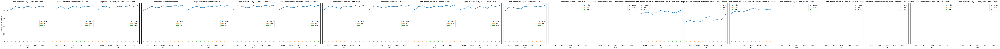

In [ ]:
top_sites = cps['Site'].value_counts().index.tolist()

cps_filtered = cps[cps['Site'].isin(top_sites)]


medians = cps_filtered.groupby(['Site', 'Parameter', 'Year']).agg({'Value': 'median',
                                                                    'MDL': 'median',
                                                                    'RDL': 'median'}).reset_index()

plot_for_parameter('Light Transmissivity', medians, top_sites)
# for param in cps['Parameter'].value_counts().index.tolist():
#     plot_for_parameter(param, medians)

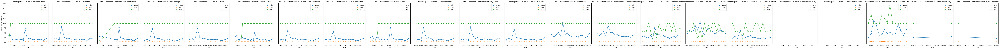

In [ ]:
plot_for_parameter('Total Suspended Solids', medians, top_sites)

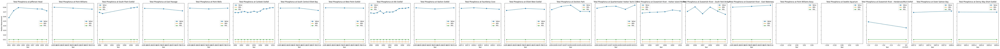

In [ ]:


plot_for_parameter('Total Phosphorus', medians, top_sites)

### Summary

* Jefferson Head - Total Suspended Solid - Needs better sediment control systesms
* Point Williams - Ammonia Nitrogen (Toxic to aquatic ecosys) - Needs better waste water discharge System
* Dockton Park and Quartermaster Harbor Yacht Club - Chlorophyll a - algae blooms - eutrophication - community and local authorities might consider monitoring runoff more closely, especially after rainfalls, and exploring additional nutrient management strategies.
* Duwamish River (South Park Bridge)  - Excess Silic - Needs thorough environmental assesments
* Dockton Park, Quartermaster Harbor Yacht Club and Duwamish River - Harbor Island Marina - sharp increase in NNN (nitrate & nitrate nitrogen) - good news is that it is decreasing from last 2 years in all the sites - need for action, whether it's cleanup, restoration, or regulation.
* South Park Bridge - Variation is total suspended solids - can reduce light penetration, affecting photosynthesis in aquatic plants and impacting fish and other organisms - increased regulation of discharges and erosion control measures.
* The trends in light transmissivity are generally positive across all sites, suggesting good water clarity and stable conditions for aquatic life.



### What actions should we take?

* Erosion Control: We need to enforce and perhaps enhance our erosion control measures, especially in areas with spikes in Total Suspended Solids. This can protect our water clarity and the life it supports.

* Nutrient Runoff Management: With the fluctuations in nutrients like Ammonia Nitrogen and Orthophosphate Phosphorus, it's imperative we examine our agricultural and wastewater management practices. Are we doing enough to prevent nutrient-rich runoff?

* Algae Monitoring Programs: Given the spikes in Chlorophyll a, setting up or enhancing existing algae monitoring programs would help us pre-emptively address the onset of harmful algal blooms.

### Assesing the variation in values for each parameters across different sites and site types

In [ ]:
grouped_by_parameter_site = cps.groupby(['Site', 'Parameter'])
parameter_site_stats = grouped_by_parameter_site['Normalised_value(mg/L)'].agg(['mean', 'std', 'count'])
sorted_parameter_site_stats = parameter_site_stats.sort_values(by='mean', ascending=False)

In [ ]:
sorted_parameter_site_stats

,,mean,std,count
Site,Parameter,,,
Carkeek Outfall,Light Transmissivity,88.655928,6.156894,1105
Vashon Outfall,Light Transmissivity,88.364015,6.508222,1081
Alki Outfall,Light Transmissivity,88.017281,6.277245,868
South Plant Outfall,Light Transmissivity,87.487566,6.262707,1705
South Central Elliott Bay,Light Transmissivity,87.330089,7.558271,1459
...,...,...,...,...
South Plant Outfall,Pheophytin a,0.000665,0.000798,1251
Point Williams,Pheophytin a,0.000636,0.000741,1133
Alki Outfall,Pheophytin a,0.000625,0.000693,1493


<ipython-input-177-1cbf0043a176>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats, ci='sd')


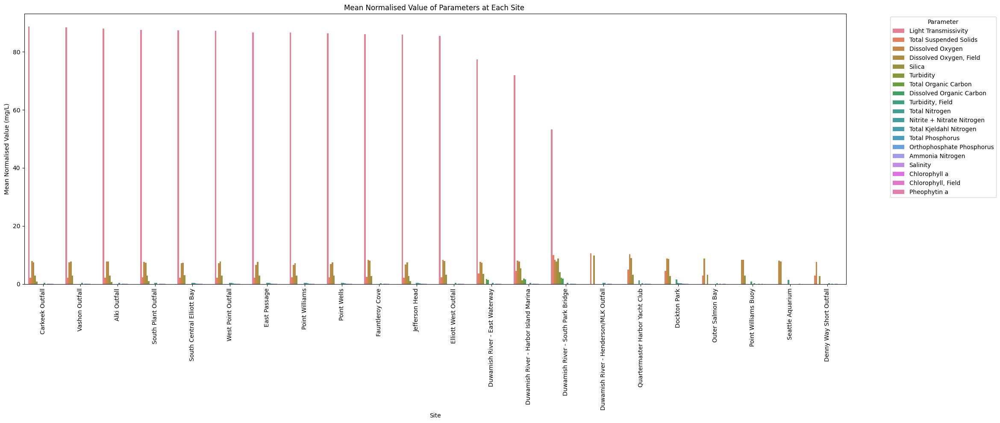

In [ ]:
sorted_parameter_site_stats.reset_index(inplace=True)

plt.figure(figsize=(20, 10))

sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats, ci='sd')

plt.xticks(rotation=90)  # Rotate the x labels to make them readable
plt.title('Mean Normalised Value of Parameters at Each Site ')
plt.ylabel('Mean Normalised Value (mg/L)')
plt.xlabel('Site')

# Show the plot
plt.tight_layout()  # Adjusts the plot to ensure everything fits without overlapping
plt.legend(title='Parameter', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot
plt.show()

* **Silica**: Essential for diatom growth, a type of algae. It's important in studies where diatom populations are a concern since they contribute to the aquatic food web and can also influence water chemistry.

* **Salinity**: Measures the salt content in water. It's crucial for determining the water's suitability for various uses and its effect on aquatic organisms, as many species have specific salinity requirements.

* **Chlorophyll a (and Chlorophyll, Field)**: Indicates the presence and amount of algae in water. Algae are primary producers in aquatic ecosystems, and their overgrowth can lead to eutrophication.

* **Pheophytin a**: A degradation product of chlorophyll a, which helps in understanding the aging of algal biomass and potentially the nutrient status of the water.

* **Dissolved Oxygen (and Dissolved Oxygen, Field)**: Essential for aquatic life. Low levels can indicate poor water quality and can result from organic material decomposition or eutrophication.

* **Nitrite + Nitrate Nitrogen**: Indicators of nutrient levels; high concentrations can cause excessive algae growth and affect aquatic life by altering water quality.

* **Light Transmissivity**: Reflects the clarity of water and the amount of light that can penetrate the water column, affecting photosynthesis in aquatic plants and algae.

* **Total Suspended Solids**: Impacts water clarity, habitat quality for aquatic life, and can transport attached pollutants.

* **Orthophosphate Phosphorus**: A nutrient that can promote algae growth. High levels can lead to eutrophication and subsequent oxygen depletion in water bodies.

* **Ammonia Nitrogen**: Toxic to aquatic organisms at high levels and can also contribute to nutrient pollution and eutrophication.

* **Total Organic Carbon**: Measures the amount of organic carbon in water. It can affect taste and odor, and serve as an indicator of organic pollutants.

* **Dissolved Organic Carbon**: Similar to TOC, it can indicate the presence of organic matter which can affect water quality and the effectiveness of disinfection processes.

* **Total Nitrogen**: Represents the sum of nitrogen species. It's important as it can contribute to nutrient pollution and eutrophication.

* **Turbidity (and Turbidity, Field)**: Measures the cloudiness of water, which can affect aquatic ecosystems and is also an indicator of overall water quality.

* **Total Phosphorus**: Like total nitrogen, it's a key nutrient that can lead to algae blooms and subsequent oxygen depletion when in excess.

* **Total Kjeldahl Nitrogen**: Encompasses organic nitrogen and ammonia, important for understanding the total nitrogen load and its potential to contribute to nutrient pollution.

### Lets analyze each parameter at each site

#### **Dissolved Oxygen** (and Dissolved Oxygen, Field) - Indicative of the water body's ability to support aquatic life. Low levels can be a sign of pollution.

<ipython-input-178-430a0521bdc8>:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


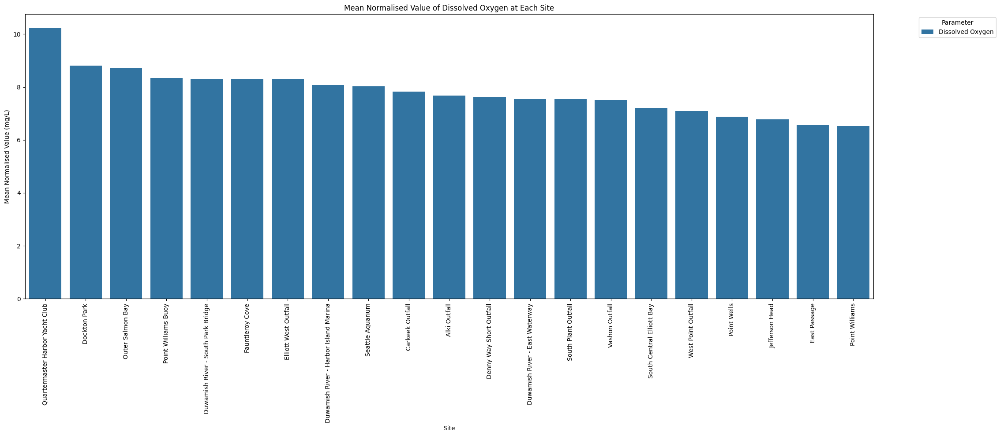

In [ ]:
sorted_parameter_site_stats_col = sorted_parameter_site_stats[sorted_parameter_site_stats['Parameter']=='Dissolved Oxygen']
sorted_parameter_site_stats_col.reset_index(inplace=True)

plt.figure(figsize=(20, 10))

sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')

plt.xticks(rotation=90)  # Rotate the x labels to make them readable
plt.title('Mean Normalised Value of Dissolved Oxygen at Each Site')
plt.ylabel('Mean Normalised Value (mg/L)')
plt.xlabel('Site')


# Show the plot
plt.tight_layout()  # Adjusts the plot to ensure everything fits without overlapping
plt.legend(title='Parameter', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot
plt.show()

* Healthy DO levels are above 6 mg/L. All sites in the graph exceed this, indicating good water quality supportive of aquatic life.

* The graph shows a small variance in DO across sites, suggesting consistent water quality management and no immediate pollution concerns.

* No site falls into the hypoxic range (<2-3 mg/L), which means aquatic organisms at these sites are not at risk from low oxygen levels.

#### **Chlorophyll a (and Chlorophyll, Field)** - Reflects the amount of algae and phytoplankton in the water, which can indicate eutrophication levels.

In [ ]:
df[df['Parameter']=='Chlorophyll a'].head(5)

,Unnamed: 0,Sample ID,Grab ID,Profile ID,Sample Number,Collect DateTime,Depth (m),Site Type,Area,Locator,...,Value,Units,QualityId,MDL,RDL,Method,Date Analyzed,Data Source,Time_difference,Normalised_value(mg/L)
70,126,1997,1437.0,535,L64990-8,04/05/2016 09:21:00 AM,1.5,Marine Offshore,Central Puget Sound,LSKQ06,...,7.200,ug/L,1,0.05,0.1,EPA 445.0,04/13/2016,KCEL,7 days 14:39:00,0.007200
74,142,2537,2537.0,128,L62977-4,06/16/2015 08:48:00 AM,34.9,Marine Offshore,Central Puget Sound,LSEP01,...,2.720,ug/L,1,0.05,0.1,EPA 445.0,06/26/2015,KCEL,9 days 15:12:00,0.002720
128,262,2006,2006.0,540,L64989-8,04/06/2016 09:01:00 AM,25.2,Marine Offshore,Central Puget Sound,KSBP01,...,2.100,ug/L,1,0.05,0.1,EPA 445.0,04/14/2016,KCEL,7 days 14:59:00,0.002100
130,266,4087,4087.0,1072,L66610-9,12/19/2016 01:27:00 PM,34.5,Marine Offshore,Central Puget Sound,KSBP01,...,0.187,ug/L,1,0.05,0.1,EPA 445.0,01/09/2017,KCEL,20 days 10:33:00,0.000187
157,318,1966,830.0,101,L64190-21,12/14/2015 10:58:00 AM,1.0,Marine Offshore,Central Puget Sound,KSSK02,...,0.451,ug/L,1,0.05,0.1,EPA 445.0,01/05/2016,KCEL,21 days 13:02:00,0.000451


<ipython-input-181-1709eadef968>:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


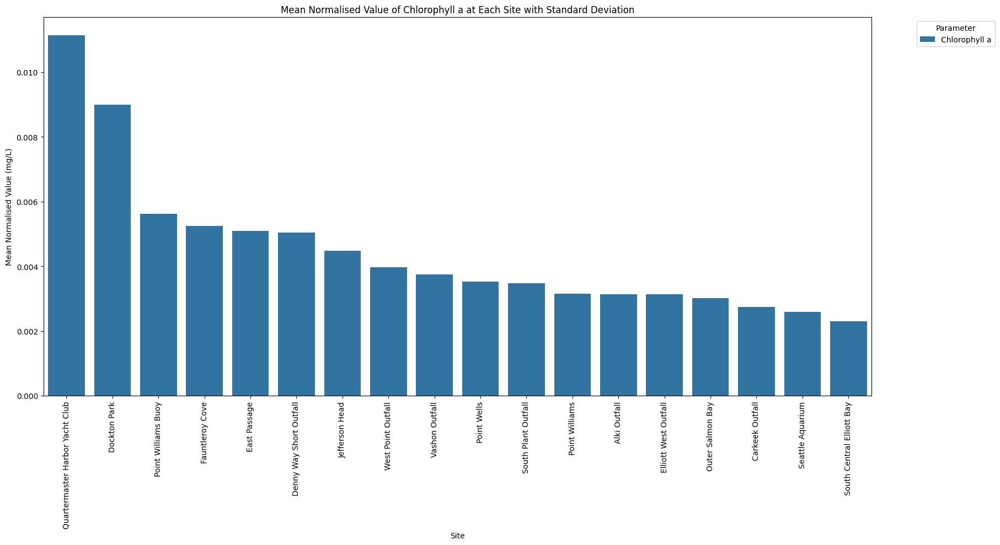

In [ ]:
# Chlorophyll a
sorted_parameter_site_stats_col = sorted_parameter_site_stats[sorted_parameter_site_stats['Parameter']=='Chlorophyll a']
sorted_parameter_site_stats_col.reset_index(inplace=True)

plt.figure(figsize=(16, 10))

sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')

plt.xticks(rotation=90)  # Rotate the x labels to make them readable
plt.title('Mean Normalised Value of Chlorophyll a at Each Site with Standard Deviation')
plt.ylabel('Mean Normalised Value (mg/L)')
plt.xlabel('Site')


# Show the plot
plt.tight_layout()  # Adjusts the plot to ensure everything fits without overlapping
plt.legend(title='Parameter', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot
plt.show()

* The chlorophyll-a levels shown are within the lower range, suggesting low algal biomass and possibly oligotrophic conditions.

* Sites at the left end of the graph such as Quatermaster Harbour Yatch Club, Dockton Park have higher chlorophyll-a concentrations, indicating more productive or nutrient-rich waters.

* The uniform decrease suggests a gradient in nutrient availability or other factors affecting algal growth across the sites.

### Parameters and It's normlized mean distribution across different sites

In [ ]:
cps['Parameter'].unique()

array(['Silica', 'Salinity', 'Chlorophyll, Field', 'Pheophytin a',
       'Dissolved Oxygen', 'Nitrite + Nitrate Nitrogen',
       'Light Transmissivity', 'Total Suspended Solids',
       'Dissolved Oxygen, Field', 'Orthophosphate Phosphorus',
       'Ammonia Nitrogen', 'Total Organic Carbon',
       'Dissolved Organic Carbon', 'Chlorophyll a', 'Total Nitrogen',
       'Turbidity, Field', 'Total Phosphorus', 'Turbidity',
       'Total Kjeldahl Nitrogen'], dtype=object)

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


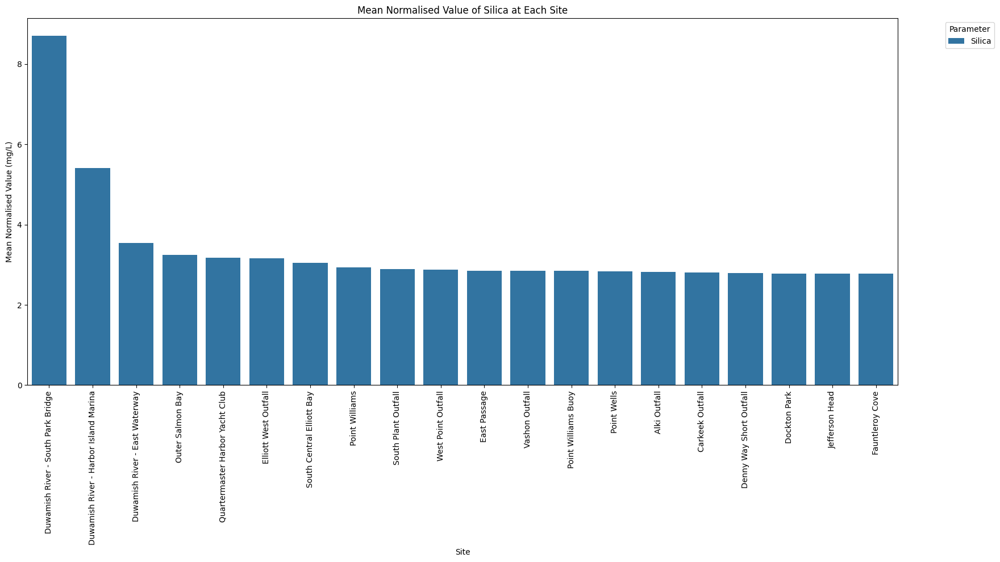

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


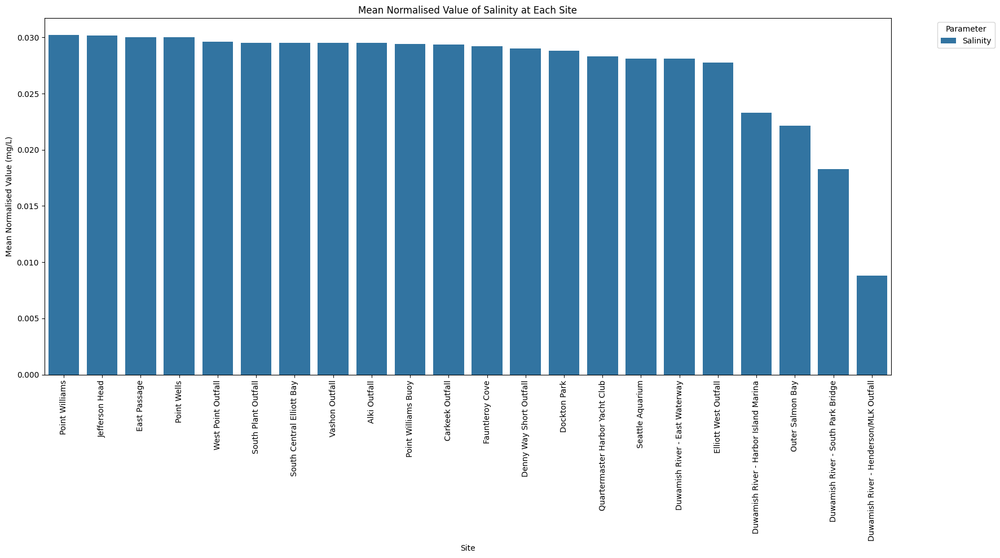

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


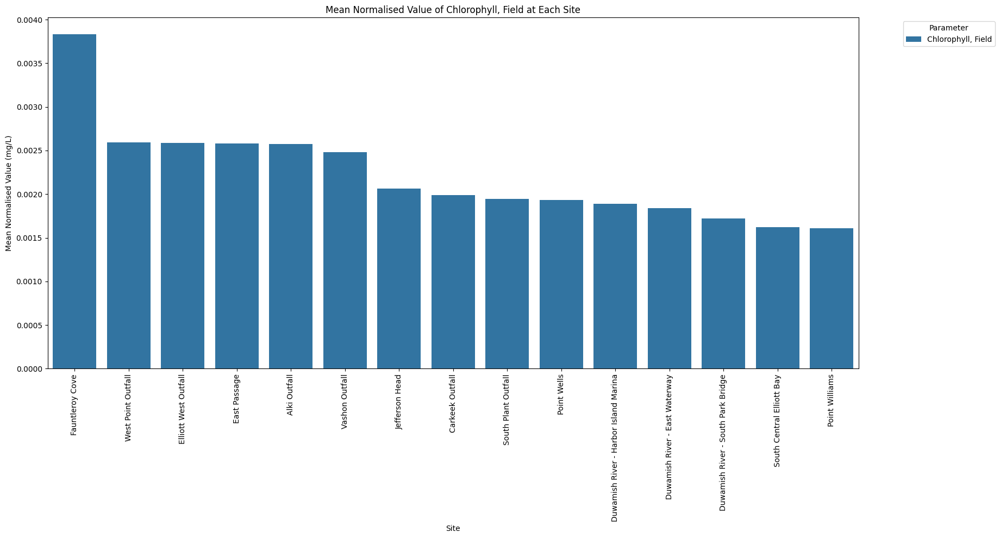

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


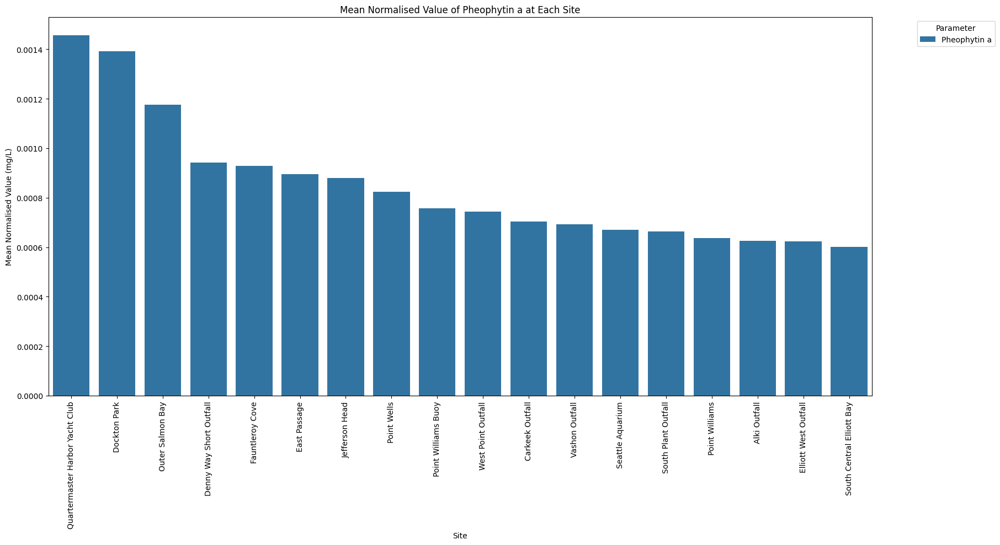

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


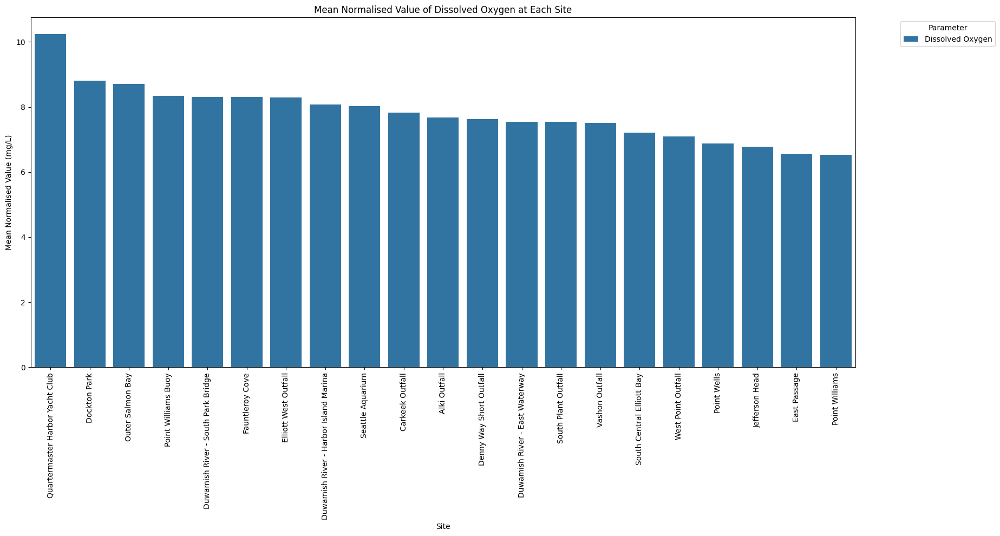

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


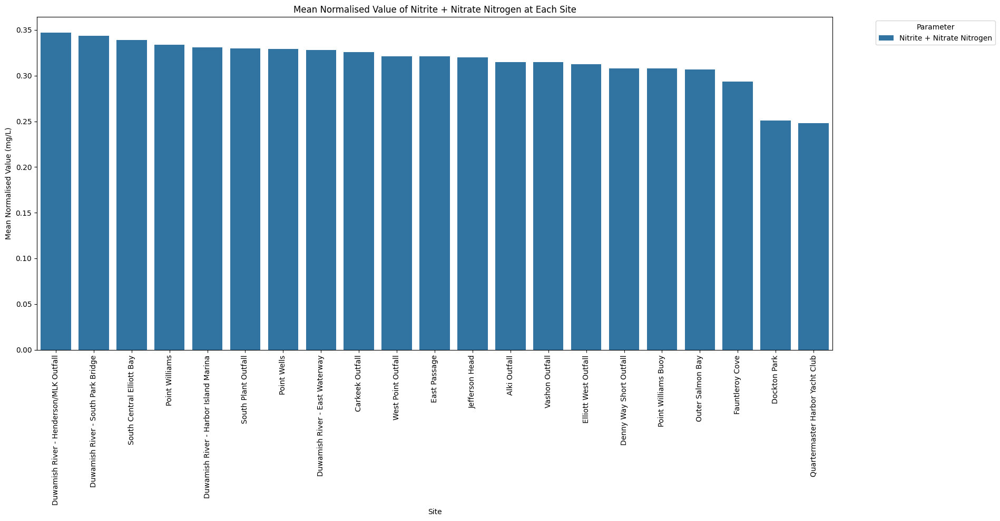

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


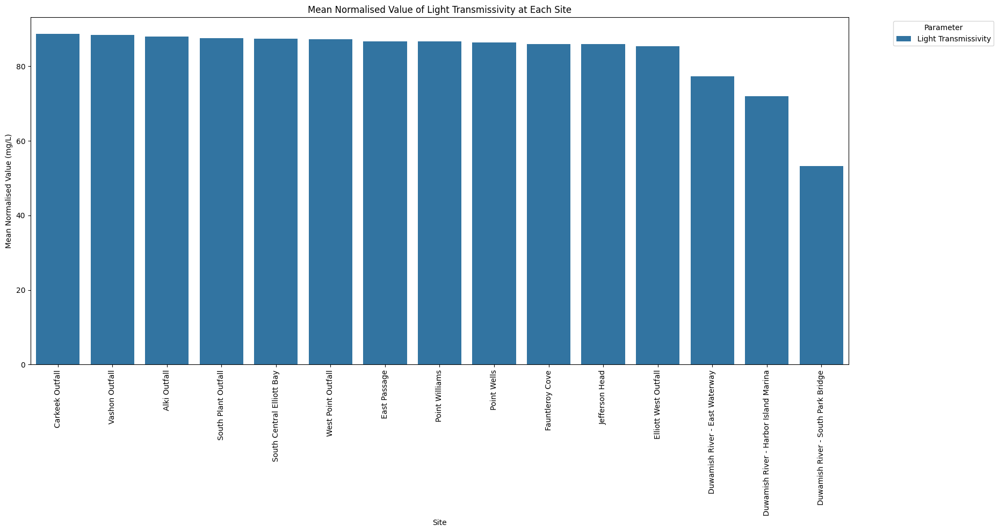

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


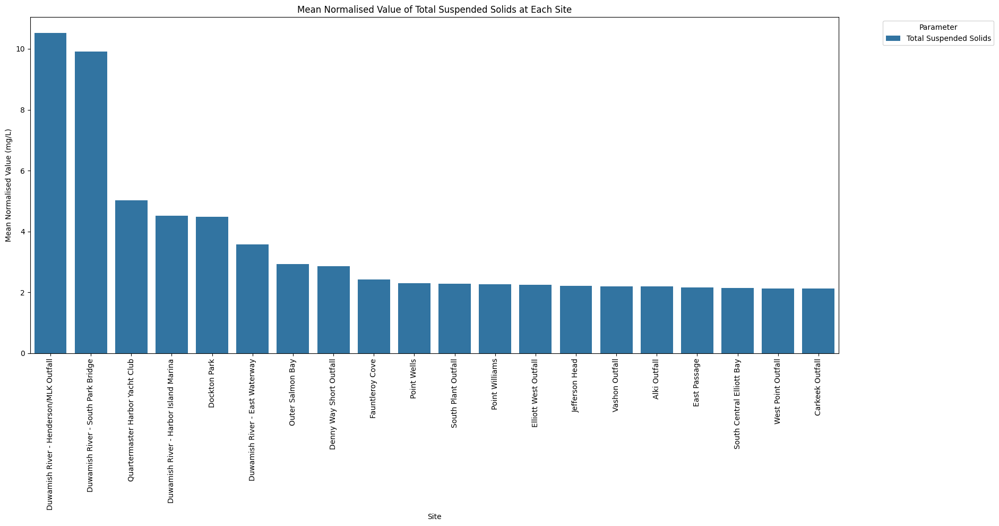

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


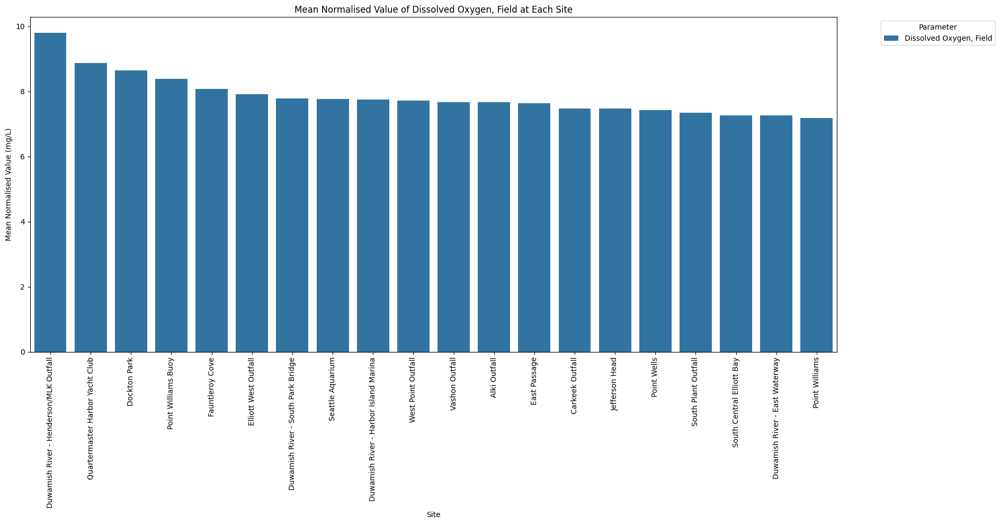

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


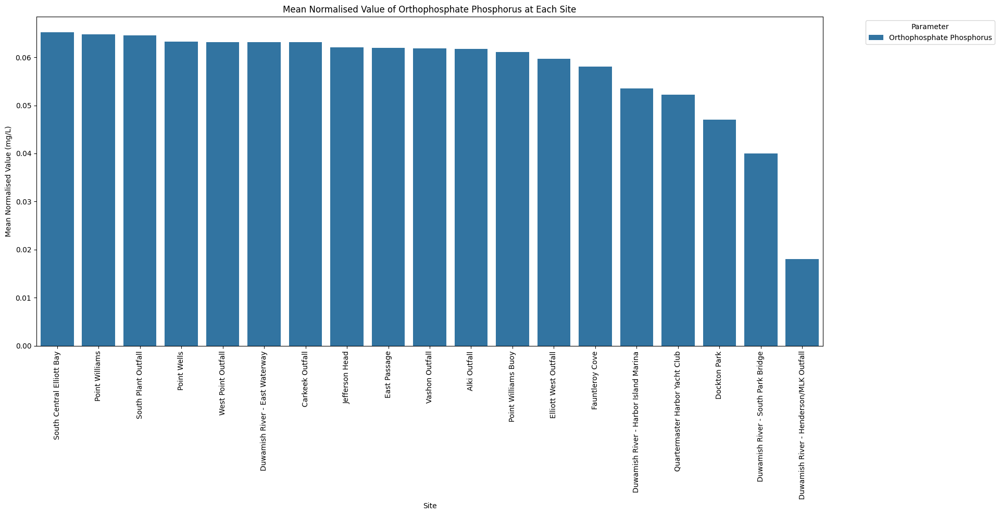

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


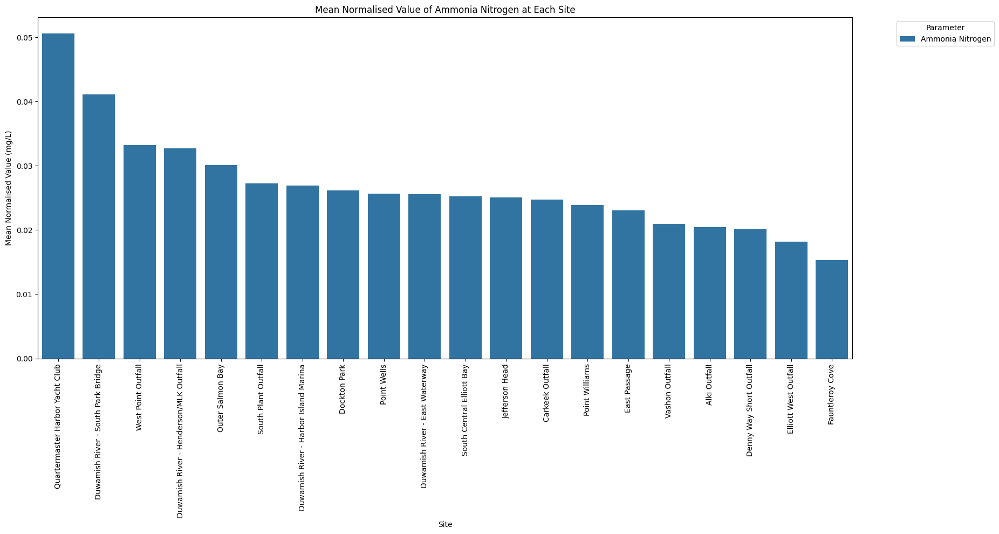

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


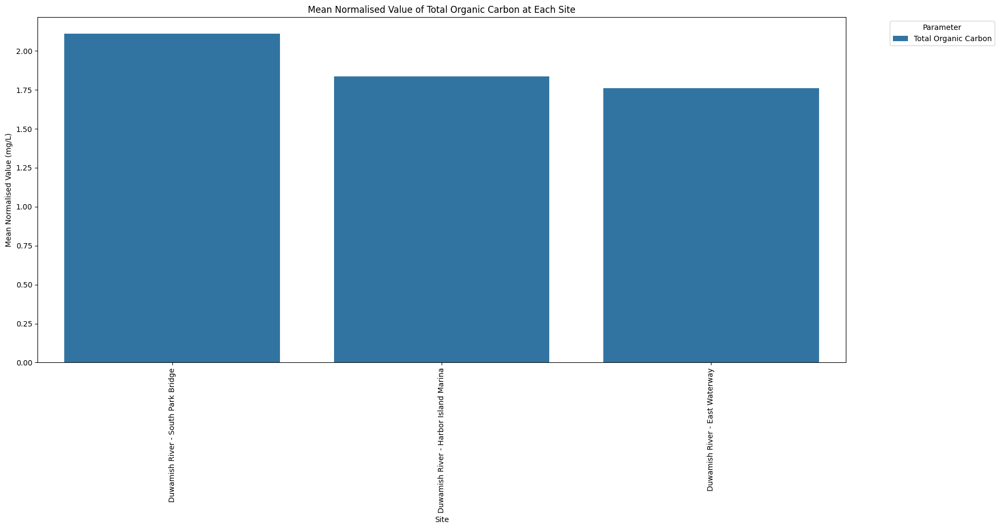

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


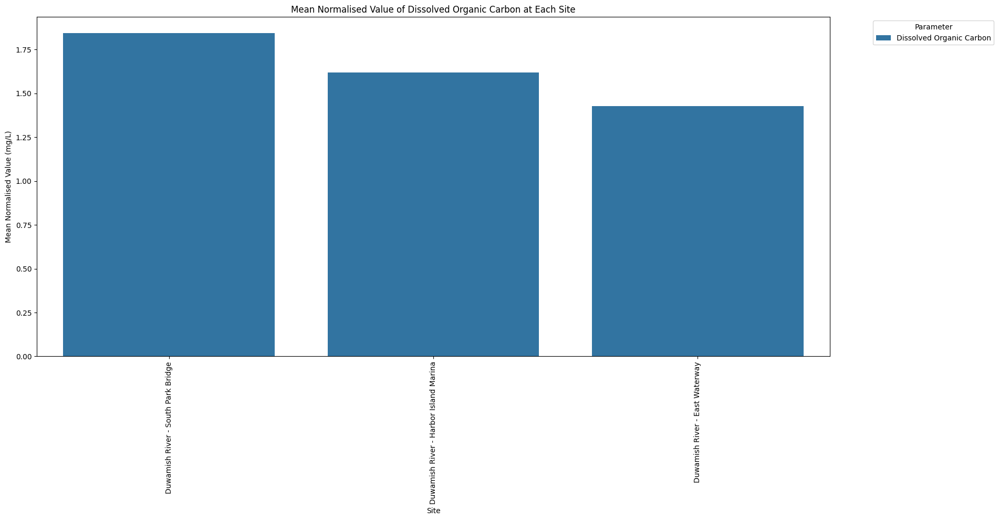

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


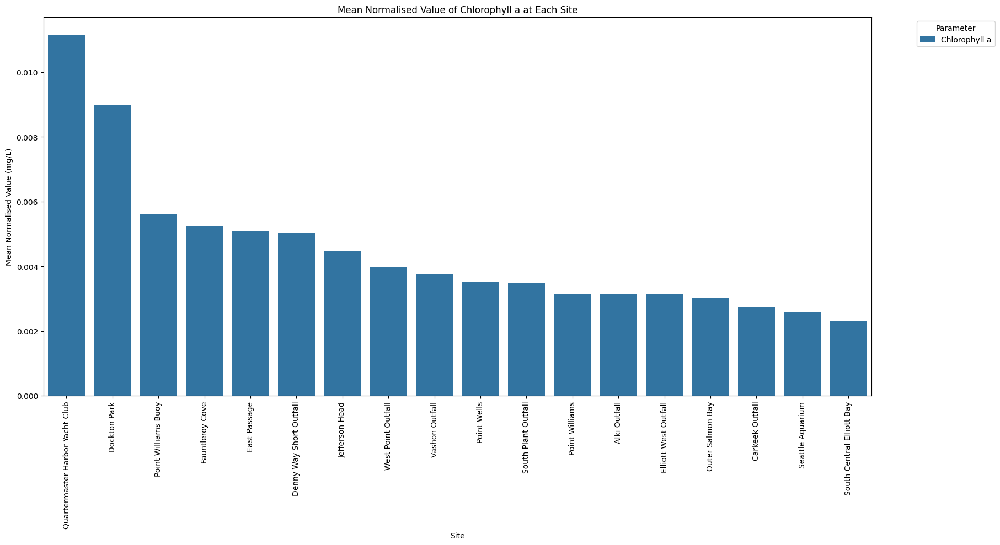

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


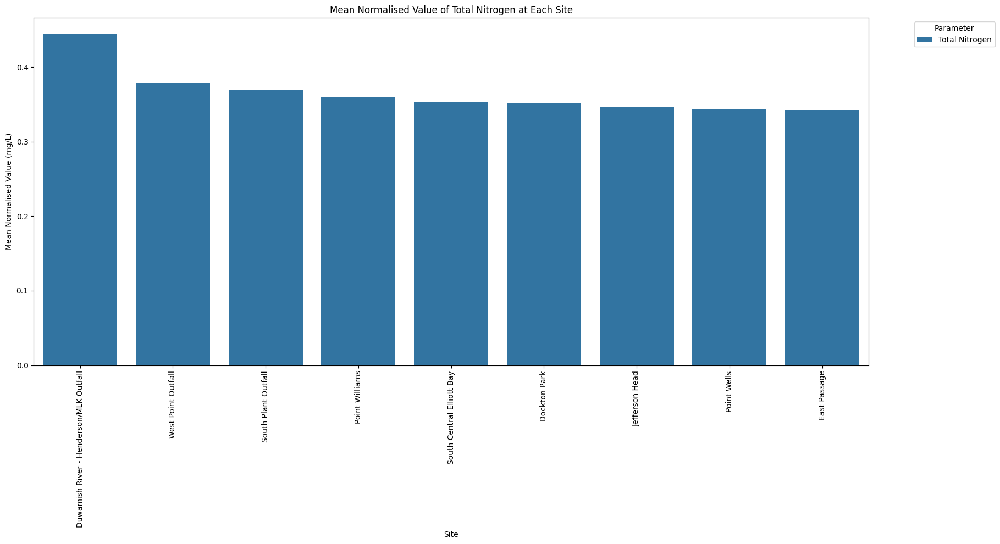

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


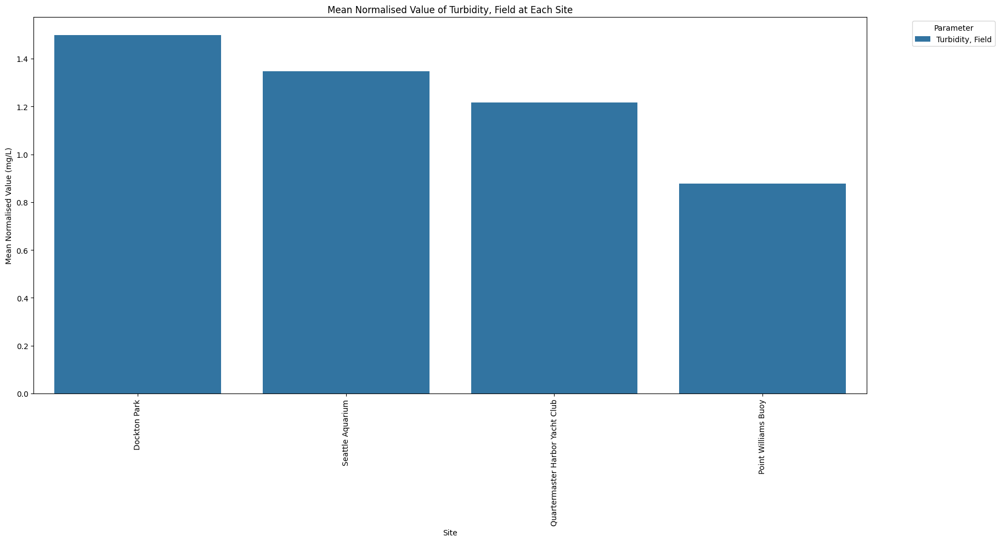

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


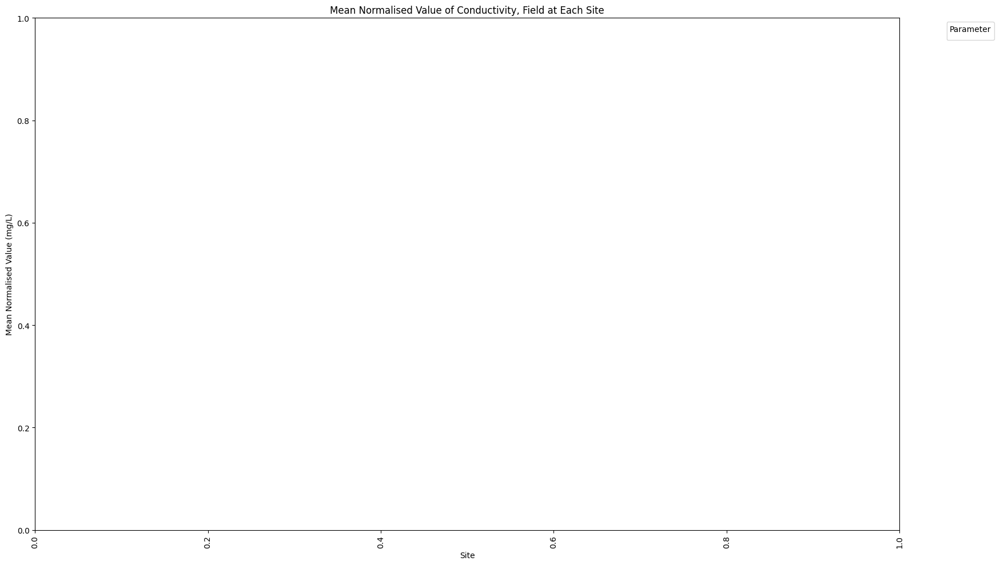

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


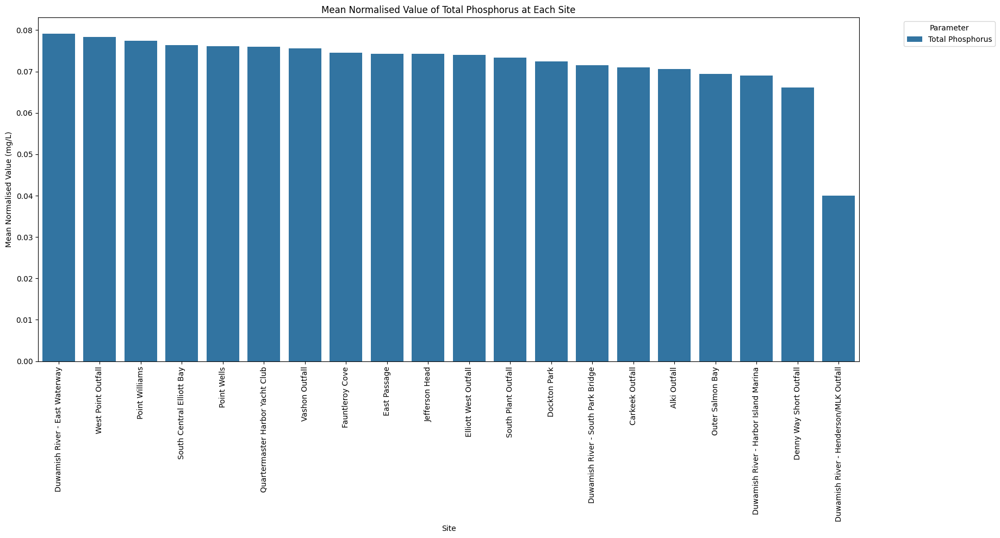

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


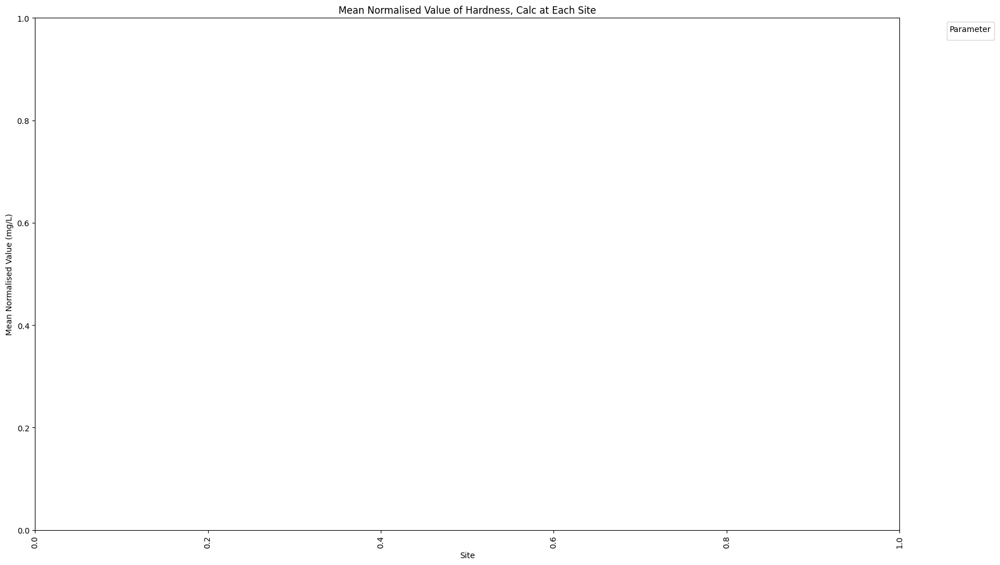

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


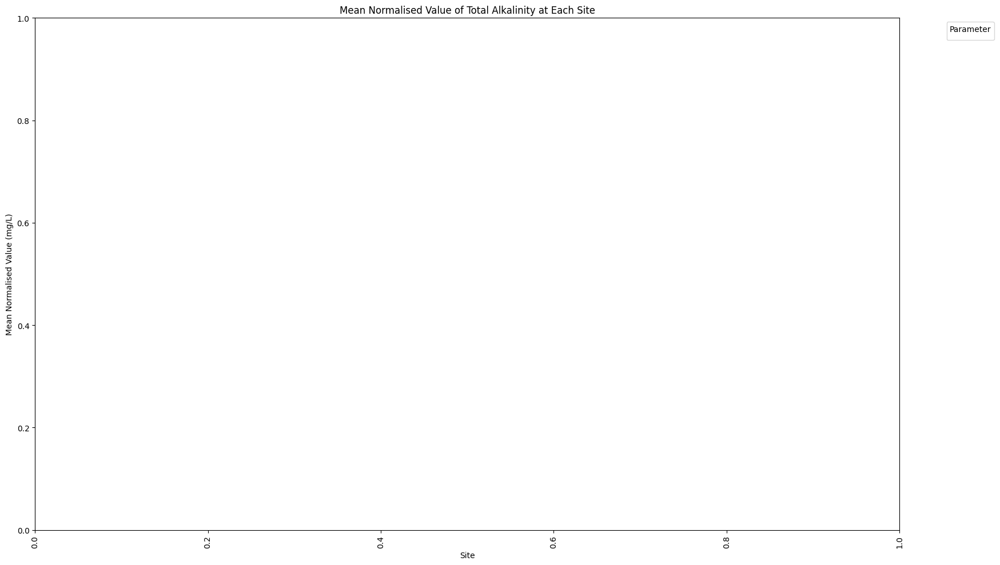

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


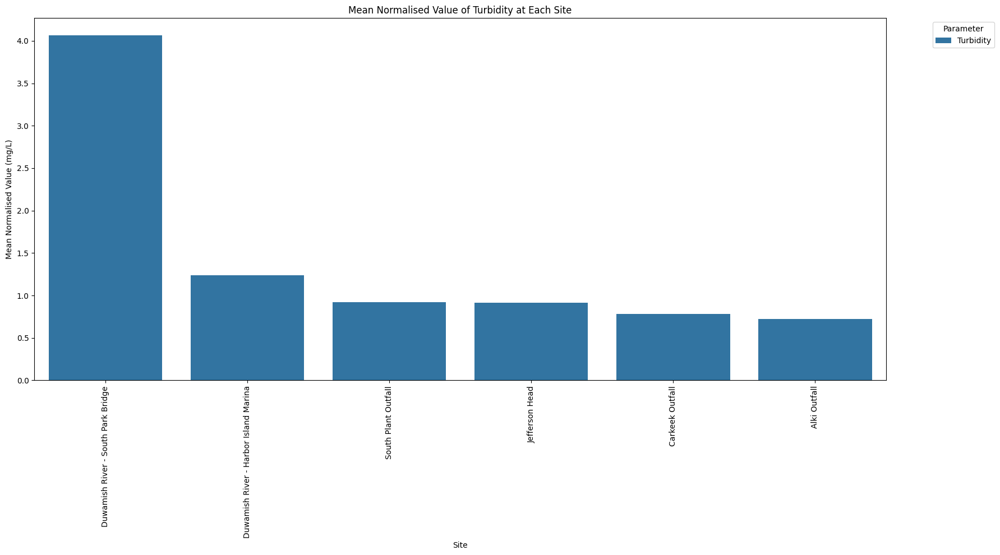

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


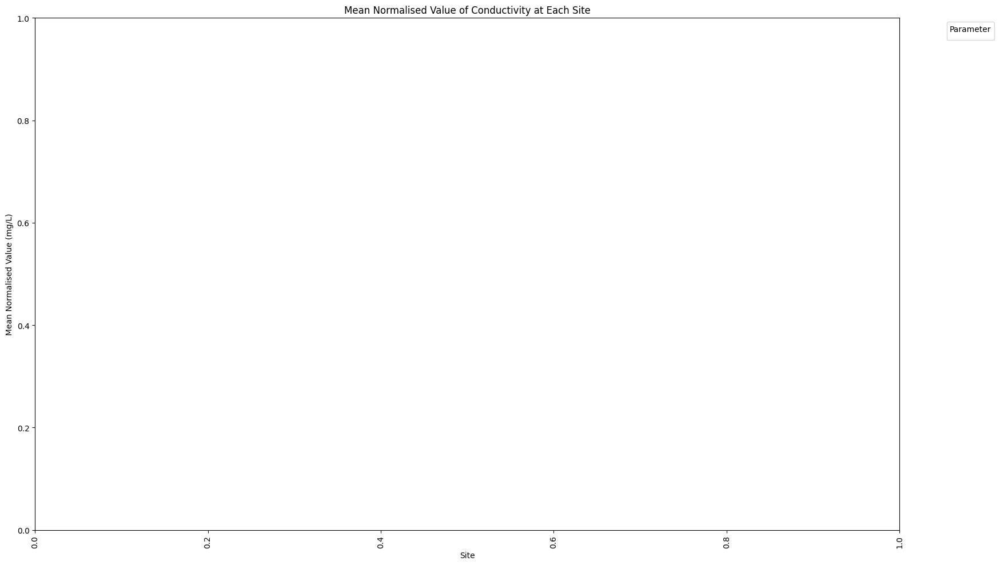

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


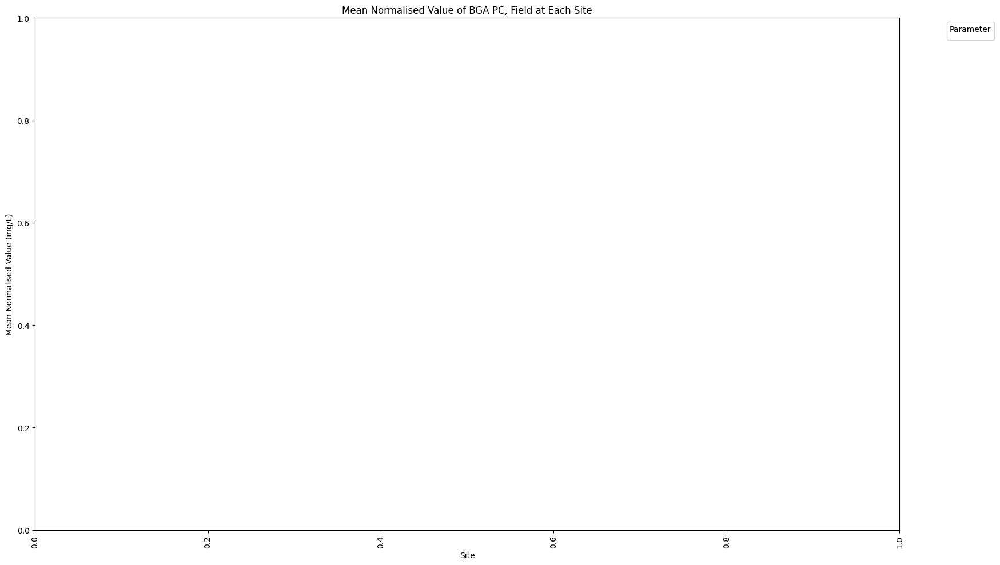

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


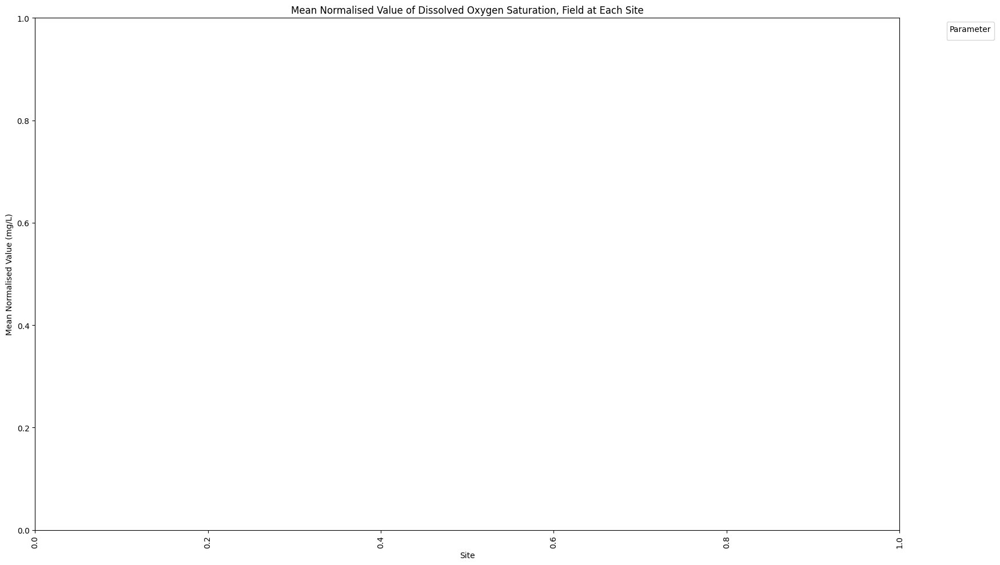

<ipython-input-183-a18797bdb61f>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')


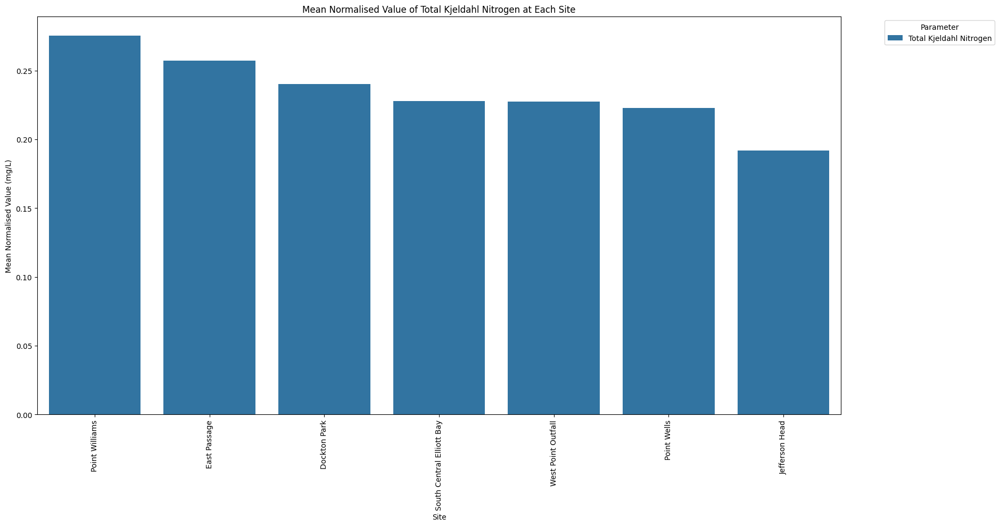

In [ ]:
# Chlorophyll a
for param in df['Parameter'].unique():
    sorted_parameter_site_stats_col = sorted_parameter_site_stats[sorted_parameter_site_stats['Parameter']==param]
    sorted_parameter_site_stats_col.reset_index(inplace=True)

    plt.figure(figsize=(16, 10))

    sns.barplot(x='Site', y='mean', hue='Parameter', data=sorted_parameter_site_stats_col, ci='sd')

    plt.xticks(rotation=90)  # Rotate the x labels to make them readable
    plt.title(f'Mean Normalised Value of {param} at Each Site')
    plt.ylabel('Mean Normalised Value (mg/L)')
    plt.xlabel('Site')


    # Show the plot
    plt.tight_layout()  # Adjusts the plot to ensure everything fits without overlapping
    plt.legend(title='Parameter', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot
    plt.show()

## Creating a heatmap to visualize the average normalized value of parameters at each site

<ipython-input-184-6b8b0aceed4d>:5: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  pivot_table = parameter_site_mean.pivot('Site', 'Parameter', 'Normalised_value(mg/L)')


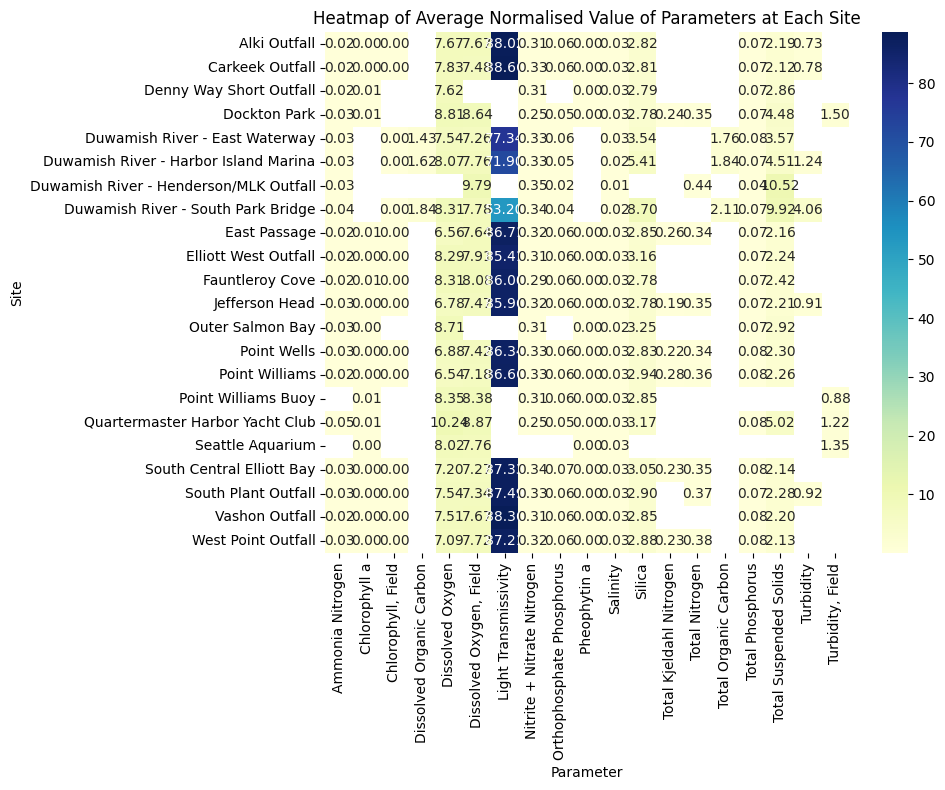

In [ ]:
# First, we need to aggregate the data
parameter_site_mean = cps.groupby(['Site', 'Parameter'])['Normalised_value(mg/L)'].mean().reset_index()

# Then, create a pivot table with 'Site' as rows, 'Parameter' as columns, and the mean values as data
pivot_table = parameter_site_mean.pivot('Site', 'Parameter', 'Normalised_value(mg/L)')

# Now, create the heatmap using seaborn
plt.figure(figsize=(10, 8))  # You might need to adjust the size to fit your data
sns.heatmap(pivot_table, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title('Heatmap of Average Normalised Value of Parameters at Each Site')
plt.xlabel('Parameter')
plt.ylabel('Site')
plt.xticks(rotation=90)  # Rotate the x labels if there are many parameters
plt.yticks(rotation=0)
plt.tight_layout()  # Adjust layout to fit the plot and labels

# Show the plot
plt.show()

Problems/Challenges found



*   Some of the parameters are not normalized to mg/L scale, and they can't be nomalized
*   Need to analyze them separately (like light transmitivity)



### Heatmap for the average QualityId for each Parameter at each Site

<ipython-input-187-1ea9e460d7bc>:4: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  quality_pivot = quality_site_parameter.pivot('Site', 'Parameter', 'QualityId')


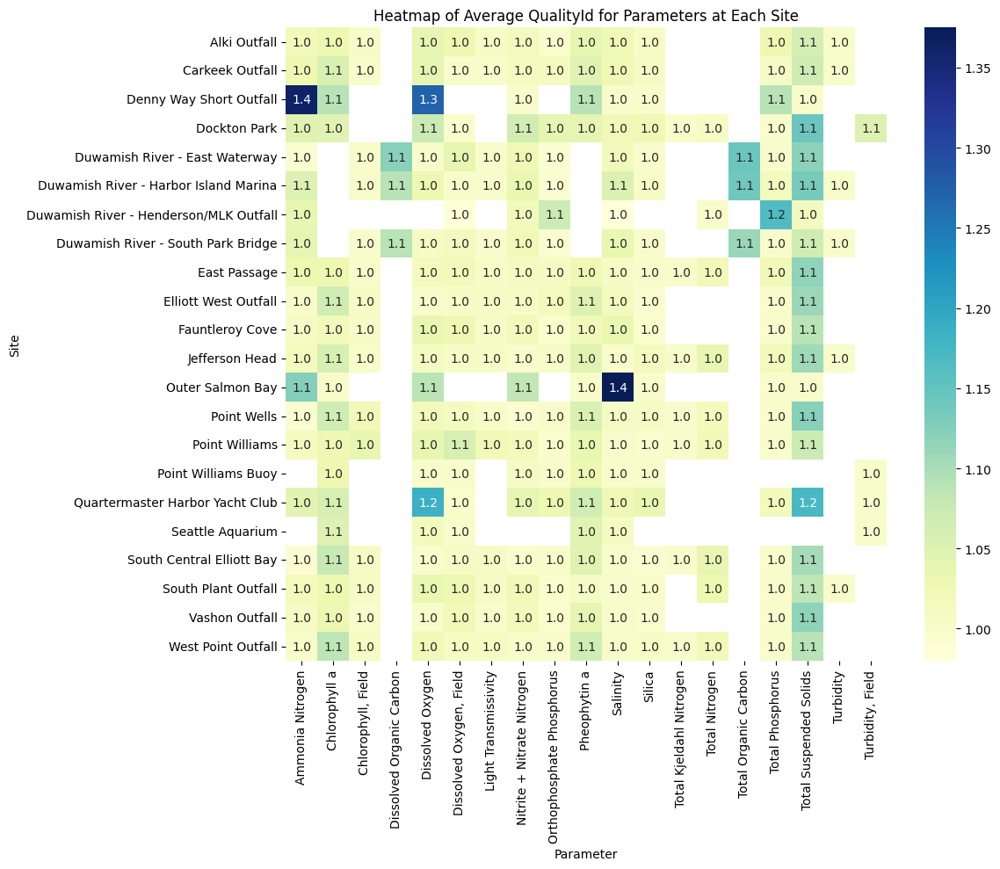

In [ ]:
quality_site_parameter = cps.groupby(['Site', 'Parameter'])['QualityId'].mean().reset_index()

# Create a pivot table with 'Site' as rows and 'Parameter' as columns, and 'QualityId' as the values
quality_pivot = quality_site_parameter.pivot('Site', 'Parameter', 'QualityId')

# Generate the heatmap using seaborn
plt.figure(figsize=(12, 10))  # Adjust the size as needed for your number of sites and parameters
sns.heatmap(quality_pivot, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title('Heatmap of Average QualityId for Parameters at Each Site')
plt.xlabel('Parameter')
plt.ylabel('Site')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()

# Show the plot
plt.show()

* QualityId appears to be fairly consistent across most sites and parameters, with the majority scoring the baseline of 1.0, suggesting a standard level of quality or condition.

* A few sites and parameters have slightly elevated QualityId scores (above 1.0 but still close to 1.0), indicating minor variations in quality assessments that may require attention.

* The 'Denny Way Short Outfall' and 'Outer Salmon Bay' show slightly varied QualityId scores for certain parameters, potentially signaling localized issues or data collection anomalies.

* Parameters such as 'Dissolved Oxygen', 'Dissolved Oxygen, Field', and 'Light Transmissivity' at some sites have variable QualityId scores, which might reflect specific environmental conditions or measurement sensitivity.

* Overall, the heatmap does not display extreme variations in QualityId, which could suggest that there are no significant quality concerns for the measured parameters at the surveyed sites.

### Most commonly performed tests, across the whole dataset, which we can use to compare it against the rest of the entries.

In [ ]:
df.columns

Index(['Unnamed: 0', 'Sample ID', 'Grab ID', 'Profile ID', 'Sample Number',
       'Collect DateTime', 'Depth (m)', 'Site Type', 'Area', 'Locator', 'Site',
       'Parameter', 'Value', 'Units', 'QualityId', 'MDL', 'RDL', 'Method',
       'Date Analyzed', 'Data Source', 'Time_difference',
       'Normalised_value(mg/L)'],
      dtype='object')

In [ ]:
df['Parameter'].unique()

array(['Silica', 'Salinity', 'Chlorophyll, Field', 'Pheophytin a',
       'Dissolved Oxygen', 'Nitrite + Nitrate Nitrogen',
       'Light Transmissivity', 'Total Suspended Solids',
       'Dissolved Oxygen, Field', 'Orthophosphate Phosphorus',
       'Ammonia Nitrogen', 'Total Organic Carbon',
       'Dissolved Organic Carbon', 'Chlorophyll a', 'Total Nitrogen',
       'Turbidity, Field', 'Conductivity, Field', 'Total Phosphorus',
       'Hardness, Calc', 'Total Alkalinity', 'Turbidity', 'Conductivity',
       'BGA PC, Field', 'Dissolved Oxygen Saturation, Field',
       'Total Kjeldahl Nitrogen'], dtype=object)

In [ ]:
df['Method'].unique()

array(['WHITLEDGE 1981', 'SM2520-B', 'CTD', 'EPA445.0', 'SM4500-O-C',
       'SM4500-NO3-F', 'SM2540-D', 'SM4500-P-F S',
       'KEROUEL & AMINOT 1997', 'HYDROLAB', 'SM5310-B', 'EPA 445.0',
       'SM4500-N-C S', 'KCEL SOP# 245', 'NONE', 'SM4500-P-F',
       'SM4500-N-C', 'SM4500-N-C (03-03-013-000)',
       'SM4500-P-B,FMOD(03-03-013-001)', 'SM2340B.ED19 (06-02-004-002)',
       'SM4500-P-B,F Modified', 'SM4500-P-B,F S',
       'SM4500-P-F (03-03-012-004)', 'SM4500-P-B,Fmod(03-03-013-000)',
       'SM4500-NO3-F (330V4)', 'SM4500-P-F (03-03-012-001)', 'EPA446.0',
       'EPA446.0 (03-02-002S-004)', 'SM4500-P-B,F',
       'SM5310-B (03-04-001-002)', 'SM2320-B (03-03-001-001)',
       'SM4500-P-F (03-03-012-000)', 'SM4500-P-B,FMOD(03-03-013-002)',
       'SM5310-B (03-04-001-003)', 'EPA446.0 (03-02-002-001)',
       'SM4500-P-F (03-03-012-002)', 'EPA446.0 (03-02-002S-003)',
       'SM4500-0-C (03-03-007-002)', 'SM4500-NO3-F (03-03-012-001)',
       'WHITLEDGE 1981 (330V4)', 'SM4500-NO3-F

In [ ]:
df[df['Units']=='PSS' ]['Method'].value_counts()

SM2520-B                    5337
SM2520-B (03-02-003-003)     410
SM2520-B (316V3)             266
SM2520-B (03-02-003-002)      93
Name: Method, dtype: int64

In [ ]:
df[df['Units']=='PSS']['Parameter'].value_counts()

Salinity    6106
Name: Parameter, dtype: int64

In [ ]:
df[(df['Parameter']=='Salinity') & (df['Method']=='SM2520-B (03-02-003-002)')]['Time_difference'].value_counts()

17 days 00:00:00    8
10 days 00:00:00    7
7 days 00:00:00     6
16 days 00:00:00    5
14 days 00:00:00    5
8 days 00:00:00     4
9 days 00:00:00     4
22 days 00:00:00    3
23 days 00:00:00    2
20 days 00:00:00    2
1 days 00:00:00     2
21 days 14:43:00    1
20 days 09:28:00    1
6 days 14:47:00     1
7 days 13:45:00     1
24 days 00:00:00    1
0 days 14:10:00     1
14 days 14:19:00    1
14 days 14:17:00    1
9 days 14:54:00     1
13 days 14:33:00    1
9 days 14:26:00     1
9 days 14:06:00     1
8 days 14:56:00     1
6 days 03:32:00     1
14 days 15:43:00    1
7 days 14:45:00     1
17 days 14:30:00    1
15 days 14:47:00    1
9 days 14:57:00     1
7 days 14:57:00     1
17 days 14:22:00    1
22 days 16:04:00    1
19 days 15:25:00    1
7 days 14:29:00     1
15 days 15:03:00    1
16 days 14:30:00    1
17 days 14:41:00    1
14 days 10:09:00    1
16 days 14:24:00    1
21 days 00:00:00    1
9 days 15:00:00     1
17 days 10:52:00    1
6 days 13:36:00     1
16 days 14:36:00    1
21 days 14

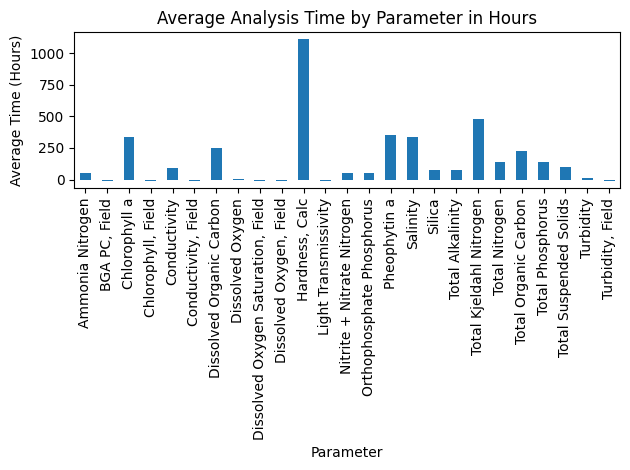

In [ ]:
df['Time_difference'] = pd.to_timedelta(df['Time_difference'])

df['Time_difference_seconds'] = df['Time_difference'].dt.total_seconds()

average_analysis_time = df.groupby('Parameter')['Time_difference_seconds'].mean()

average_analysis_time_hours = average_analysis_time / 3600

average_analysis_time_hours.plot(kind='bar')
plt.title('Average Analysis Time by Parameter in Hours')
plt.xlabel('Parameter')
plt.ylabel('Average Time (Hours)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

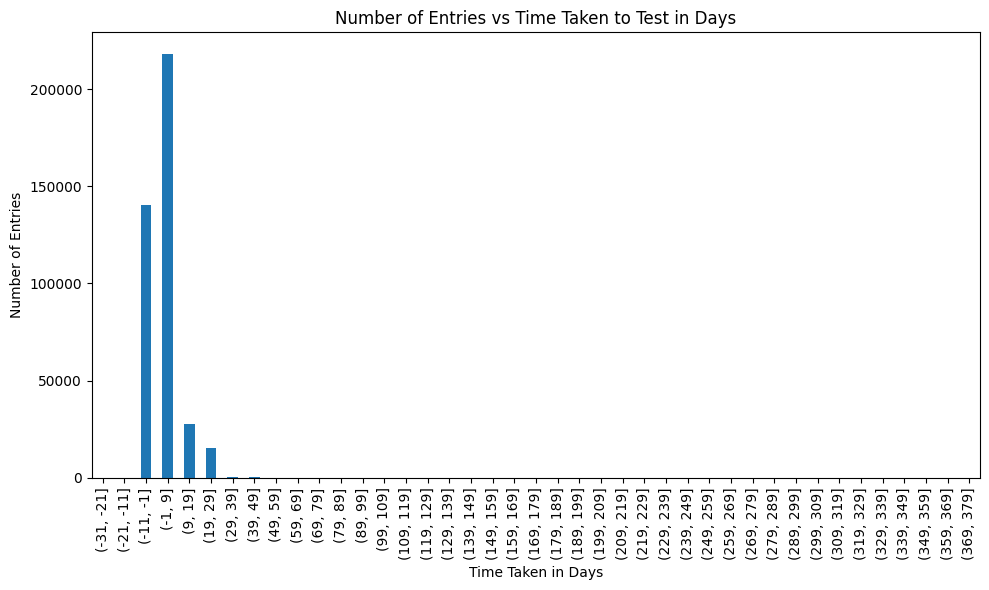

In [ ]:
df['Test_days'] = df['Time_difference'].dt.days

bins = range(int(df['Test_days'].min()), int(df['Test_days'].max()) + 10, 10)
df['binned'] = pd.cut(df['Test_days'], bins=bins)

days_counts = df['binned'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
days_counts.plot(kind='bar')
plt.title('Number of Entries vs Time Taken to Test in Days')
plt.xlabel('Time Taken in Days')
plt.ylabel('Number of Entries')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
df['Test_days'] = df['Time_difference'].dt.days

bins = range(int(df['Test_days'].min()), int(df['Test_days'].max()) + 10, 10)
df['binned'] = pd.cut(df['Test_days'], bins=bins)

days_counts = df['binned'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
days_counts.plot(kind='bar')
plt.title('Number of Entries vs Time Taken to Test in Days')
plt.xlabel('Time Taken in Days')
plt.ylabel('Number of Entries')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
df['Test_days'].describe()

count    402883.000000
mean          2.883455
std           7.061563
min         -31.000000
25%          -1.000000
50%           0.000000
75%           3.000000
max         375.000000
Name: Test_days, dtype: float64

In [ ]:
df[df['Test_days']>=100]

,Unnamed: 0,Sample ID,Grab ID,Profile ID,Sample Number,Collect DateTime,Depth (m),Site Type,Area,Locator,...,QualityId,MDL,RDL,Method,Date Analyzed,Data Source,Time_difference,Normalised_value(mg/L),Time_difference_seconds,Test_days
33527,70266,61413,61413.0,42127,L37573-2,12/05/2005 09:09:00 AM,1.60,Large Lakes,Lake Washington,0852,...,2,0.50,1.00,WHITLEDGE 1981 (03-03-012-003),12/16/2006,KCEL,375 days 14:51:00,7.030000,32453460.0,375
49876,151151,49473,49473.0,41561,L39528-18,07/10/2006 11:37:00 AM,1.00,Large Lakes,Lake Sammamish,0612,...,2,0.20,1.25,SM2340B.ED19 (06-03-009-000),10/20/2006,KCEL,101 days 12:23:00,0.436607,8770980.0,101
49974,151595,130056,130056.0,51044,L39528-11,07/11/2006 11:04:00 AM,1.00,Large Lakes,Lake Washington,4903,...,2,0.20,1.25,SM2340B.ED19 (06-03-009-000),10/20/2006,KCEL,100 days 12:56:00,0.427615,8686560.0,100
50569,154611,140104,140104.0,55108,L39528-13,07/11/2006 11:50:00 AM,1.00,Large Lakes,Lake Washington,0834,...,2,0.20,1.25,SM2340B.ED19 (06-03-009-000),10/20/2006,KCEL,100 days 12:10:00,0.427615,8683800.0,100
57427,188451,170957,170957.0,75275,L26728-33,12/17/2002 12:00:00 AM,15.10,Marine Offshore,Central Puget Sound,LSKQ06,...,1,0.05,0.10,WHITLEDGE 1981 (03-03-012-002),12/18/2003,KCEL,366 days 00:00:00,3.150000,31622400.0,366
76264,280038,171699,171699.0,75354,L26728-2,12/17/2002 10:01:00 AM,1.40,Marine Offshore,Central Puget Sound,CK200P,...,1,0.02,0.04,SM4500-NO3-F (03-03-012-002),12/18/2003,KCEL,365 days 13:59:00,0.399000,31586340.0,365
80126,298512,171750,171750.0,75354,L26728-3,12/17/2002 12:00:00 AM,15.30,Marine Offshore,Central Puget Sound,CK200P,...,1,0.05,0.10,WHITLEDGE 1981 (03-03-012-002),12/18/2003,KCEL,366 days 00:00:00,3.110000,31622400.0,366
84859,321224,61417,61417.0,42127,L37573-6,12/05/2005 09:06:00 AM,58.00,Large Lakes,Lake Washington,0852,...,2,0.50,1.00,WHITLEDGE 1981 (03-03-012-003),12/16/2006,KCEL,375 days 14:54:00,9.870000,32453640.0,375
92294,357318,81408,81408.0,44127,L23594-10,03/26/2002 12:05:00 PM,7.00,Large Lakes,Lake Washington,0804,...,2,0.20,1.25,SM2340B.ED19 (06-02-004-002),08/29/2002,KCEL,155 days 11:55:00,0.410630,13434900.0,155
94352,367436,140729,140729.0,55192,L23594-1,03/26/2002 09:54:00 AM,1.00,Large Lakes,Lake Washington,0845,...,2,0.20,1.25,SM2340B.ED19 (06-02-004-002),08/29/2002,KCEL,155 days 14:06:00,0.362674,13442760.0,155


In [ ]:
len(set(df['Sample ID']))

75817

In [ ]:
df[df['Parameter']=='Dissolved Oxygen, Field'].shape

(45791, 22)